## Importing the libraries

In [1859]:
#Importing packages
import numpy as np
import pandas as pd

# Importing matplotlib and seaborn for graphs
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white")

#Import packages for remove warnings
import warnings
warnings.filterwarnings('ignore')

from matplotlib.ticker import FormatStrFormatter

# Import the MinMaxScaler()
from sklearn.preprocessing import MinMaxScaler

# Train & Test data split
from sklearn.model_selection import train_test_split

#Improting the PCA module
from sklearn.decomposition import PCA

# Importing RFE and LogisticRegression
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# Importing RandomForestClassifier and DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.tree import DecisionTreeClassifier

from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, recall_score

# GridSearch, cross_val_score & KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

# Statsmodel
import statsmodels.api as sm

# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Glimpse of Data
 - Loading "./telecom_churn_data.csv"
 - How many Rows and Columns
 - Getting the names of the Columns of Telecom Churn Data
 - Removing duplicates if any
 - Removing the data based on uniqueness of the data

In [1860]:
telecom_churn_data = pd.read_csv('./telecom_churn_data.csv')
telecom_churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


### How many Rows and Columns

In [1861]:
telecom_churn_data.shape

(99999, 226)

### Getting the names of the Columns of Car Data

In [1862]:
print(list(telecom_churn_data.columns))

['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou

## Duplicate check

In [1863]:
# Dropping Duplicates if any
telecom_churn_data=telecom_churn_data.drop_duplicates()
telecom_churn_data.shape

# No duplicates found.

(99999, 226)

## Uniques of the data with respestive to each columns

In [1864]:
telecom_churn_data.loc[:,telecom_churn_data.nunique() < 2].nunique()

circle_id               1
loc_og_t2o_mou          1
std_og_t2o_mou          1
loc_ic_t2o_mou          1
last_date_of_month_6    1
last_date_of_month_7    1
last_date_of_month_8    1
last_date_of_month_9    1
std_og_t2c_mou_6        1
std_og_t2c_mou_7        1
std_og_t2c_mou_8        1
std_og_t2c_mou_9        1
std_ic_t2o_mou_6        1
std_ic_t2o_mou_7        1
std_ic_t2o_mou_8        1
std_ic_t2o_mou_9        1
dtype: int64

In [1865]:
telecom_churn_data[['circle_id','mobile_number','last_date_of_month_6' , 'last_date_of_month_7', 
                    'last_date_of_month_8', 'last_date_of_month_9']].head()

,circle_id,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9
0,109,7000842753,6/30/2014,7/31/2014,8/31/2014,9/30/2014
1,109,7001865778,6/30/2014,7/31/2014,8/31/2014,9/30/2014
2,109,7001625959,6/30/2014,7/31/2014,8/31/2014,9/30/2014
3,109,7001204172,6/30/2014,7/31/2014,8/31/2014,9/30/2014
4,109,7000142493,6/30/2014,7/31/2014,8/31/2014,9/30/2014


In [1866]:
# Dropping circle_id since we have data for only Telecom circle Area.
# Last Date of Month indicates each months last date. Its doesnot show any variance. Hence removed.
telecom_churn_data.drop(['circle_id','mobile_number','last_date_of_month_6' , 'last_date_of_month_7', 
                    'last_date_of_month_8', 'last_date_of_month_9'], 1, inplace = True)

# Inferences

 - Clearly **circle_id** is having only one value which indicates that data is present for only one  **Telecom Circle Area** and can be dropped.
 - Last Date of Month indicates each months last date which show no variance. Hence dropping of **last_date_of_month_6 ,last_date_of_month_7,last_date_of_month_8 & last_date_of_month_9**

In [1867]:
telecom_churn_data.shape

(99999, 220)

In [1868]:
telecom_churn_data[['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou','std_og_t2c_mou_6',
                   'std_og_t2c_mou_7' , 'std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6',
                    'std_ic_t2o_mou_7' , 'std_ic_t2o_mou_8','std_ic_t2o_mou_9']].head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9
0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Inferences

### - Columns mentioned below does not show any variance. Only one unique value. Hence dropping the columns.
    - loc_og_t2o_mou
    - std_og_t2o_mou
    - loc_ic_t2o_mou
    - std_og_t2c_mou_6
    - std_og_t2c_mou_7
    - std_og_t2c_mou_8
    - std_og_t2c_mou_9
    - std_ic_t2o_mou_6
    - std_ic_t2o_mou_7
    - std_ic_t2o_mou_8
    - std_ic_t2o_mou_9

In [1869]:
total_null = telecom_churn_data[['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou']].isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data[['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou']].isnull().sum()/telecom_churn_data[['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou']].isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data[['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou']].shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head()

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
loc_ic_t2o_mou,1018,1.02
std_og_t2o_mou,1018,1.02
loc_og_t2o_mou,1018,1.02


In [1870]:
#dropping columns mentioned above since no variance
telecom_churn_data.drop(['loc_og_t2o_mou','std_og_t2o_mou' , 'loc_ic_t2o_mou','std_og_t2c_mou_6',
                   'std_og_t2c_mou_7' , 'std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6',
                   'std_ic_t2o_mou_7' , 'std_ic_t2o_mou_8','std_ic_t2o_mou_9'], 1, inplace = True)

In [1871]:
telecom_churn_data.shape

(99999, 209)

In [1872]:
telecom_churn_data.loc[:,telecom_churn_data.nunique() < 4].nunique()

night_pck_user_6    2
night_pck_user_7    2
night_pck_user_8    2
night_pck_user_9    2
fb_user_6           2
fb_user_7           2
fb_user_8           2
fb_user_9           2
dtype: int64

# Data Cleaning
- Missing Values
- Datatype validation of the columns.
- Misspelling (Column Names)

## Identifying missing percentages

In [1873]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(20)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
total_rech_data_6,74846,74.85
count_rech_2g_6,74846,74.85
arpu_2g_6,74846,74.85
arpu_3g_6,74846,74.85
av_rech_amt_data_6,74846,74.85
count_rech_3g_6,74846,74.85
fb_user_6,74846,74.85
night_pck_user_6,74846,74.85
max_rech_data_6,74846,74.85
date_of_last_rech_data_6,74846,74.85


# Inferences 

- As in this project we are not doing **Revenue-based churn**, we are removing all features related to Revenue.

In [1874]:
# Dropping Revenue based feature as in this project we are using Churn based on Usage.
telecom_churn_data.drop(['arpu_6','arpu_7','arpu_8','arpu_9','arpu_3g_6','arpu_3g_7','arpu_3g_8',
                         'arpu_3g_9','arpu_2g_6','arpu_2g_7','arpu_2g_8','arpu_2g_9'],1,inplace=True)

In [1875]:
telecom_churn_data.shape

(99999, 197)

In [1876]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(20)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
count_rech_2g_6,74846,74.85
date_of_last_rech_data_6,74846,74.85
count_rech_3g_6,74846,74.85
av_rech_amt_data_6,74846,74.85
fb_user_6,74846,74.85
max_rech_data_6,74846,74.85
total_rech_data_6,74846,74.85
night_pck_user_6,74846,74.85
count_rech_2g_7,74428,74.43
count_rech_3g_7,74428,74.43


# Inferences 

- Setting fb_user_* & night_pck_user_* as Unknown

In [1877]:
# Replacing NaN values in fb_user and night_pck_user with Unknown
colname = ['fb_user_6','fb_user_7','fb_user_8','fb_user_9','night_pck_user_6','night_pck_user_7',
           'night_pck_user_8','night_pck_user_9']

telecom_churn_data[colname] = telecom_churn_data[colname].apply(lambda x:x.fillna("Unknown"))

In [1878]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(20)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
count_rech_2g_6,74846,74.85
total_rech_data_6,74846,74.85
av_rech_amt_data_6,74846,74.85
max_rech_data_6,74846,74.85
count_rech_3g_6,74846,74.85
date_of_last_rech_data_6,74846,74.85
date_of_last_rech_data_7,74428,74.43
total_rech_data_7,74428,74.43
av_rech_amt_data_7,74428,74.43
count_rech_3g_7,74428,74.43


In [1879]:
telecom_churn_data[['count_rech_2g_6','count_rech_2g_7' ,'count_rech_2g_8', 'count_rech_2g_9', 
                    'count_rech_3g_6','count_rech_3g_7' ,'count_rech_3g_8', 'count_rech_3g_9'
                   ]].describe()

,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9
count,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000
mean,1.864668,2.044699,2.016288,1.781807,0.599133,0.621720,0.635711,0.659363
std,2.570254,2.768332,2.720132,2.214701,1.274428,1.394524,1.422827,1.411513
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000
max,42.000000,48.000000,44.000000,40.000000,29.000000,35.000000,45.000000,49.000000


# Inferences
- As NA indicates customer has not recharged 2g or 3g for the month
- Imputing NA values by zero

In [1880]:
# For count variables, imputing NA values by zero 
# As it indicates customer has not recharged 2g or 3g for the month.  
count_cols = ['count_rech_2g_6','count_rech_2g_7' ,'count_rech_2g_8', 'count_rech_2g_9', 
              'count_rech_3g_6','count_rech_3g_7' ,'count_rech_3g_8', 'count_rech_3g_9']

telecom_churn_data[count_cols] = telecom_churn_data[count_cols].apply(lambda x:x.fillna(0))

In [1881]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(20)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
total_rech_data_6,74846,74.85
av_rech_amt_data_6,74846,74.85
max_rech_data_6,74846,74.85
date_of_last_rech_data_6,74846,74.85
av_rech_amt_data_7,74428,74.43
max_rech_data_7,74428,74.43
date_of_last_rech_data_7,74428,74.43
total_rech_data_7,74428,74.43
av_rech_amt_data_9,74077,74.08
max_rech_data_9,74077,74.08


In [1882]:
telecom_churn_data[['total_rech_data_6','av_rech_amt_data_6','max_rech_data_6',
                   'total_rech_data_7','av_rech_amt_data_7','max_rech_data_7',
                   'total_rech_data_8','av_rech_amt_data_8','max_rech_data_8',
                   'total_rech_data_9','av_rech_amt_data_9','max_rech_data_9']].describe()

,total_rech_data_6,av_rech_amt_data_6,max_rech_data_6,total_rech_data_7,av_rech_amt_data_7,max_rech_data_7,total_rech_data_8,av_rech_amt_data_8,max_rech_data_8,total_rech_data_9,av_rech_amt_data_9,max_rech_data_9
count,25153.000000,25153.000000,25153.000000,25571.000000,25571.000000,25571.000000,26339.000000,26339.000000,26339.000000,25922.000000,25922.000000,25922.00000
mean,2.463802,192.600982,126.393392,2.666419,200.981292,126.729459,2.651999,197.526489,125.717301,2.441170,192.734315,124.94144
std,2.789128,192.646318,108.477235,3.031593,196.791224,109.765267,3.074987,191.301305,109.437851,2.516339,188.400286,111.36376
min,1.000000,1.000000,1.000000,1.000000,0.500000,1.000000,1.000000,0.500000,1.000000,1.000000,1.000000,1.00000
25%,1.000000,82.000000,25.000000,1.000000,92.000000,25.000000,1.000000,87.000000,25.000000,1.000000,69.000000,25.00000
50%,1.000000,154.000000,145.000000,1.000000,154.000000,145.000000,1.000000,154.000000,145.000000,2.000000,164.000000,145.00000
75%,3.000000,252.000000,177.000000,3.000000,252.000000,177.000000,3.000000,252.000000,179.000000,3.000000,252.000000,179.00000
max,61.000000,7546.000000,1555.000000,54.000000,4365.000000,1555.000000,60.000000,4076.000000,1555.000000,84.000000,4061.000000,1555.00000


# Inferences
- Minimum recharge value is 1 or 0.5. 0 indicates that customer has not recharged
- Imputing NA values by 0 which indicates customer has not recharged.
- For Recharge related Columns
    1. total_rech_data_6','av_rech_amt_data_6','max_rech_data_6',
    2. 'total_rech_data_7','av_rech_amt_data_7','max_rech_data_7',
    3. 'total_rech_data_8','av_rech_amt_data_8','max_rech_data_8',
    4. 'total_rech_data_9','av_rech_amt_data_9','max_rech_data_9

In [1883]:
# For recharge variables, imputing NA values by zero which indicates customer has not recharged.
# Minimum recharge value is 1 or 0.5. 0 indicates that customer has not recharged
rech_cols = ['total_rech_data_6','av_rech_amt_data_6','max_rech_data_6',
                   'total_rech_data_7','av_rech_amt_data_7','max_rech_data_7',
                   'total_rech_data_8','av_rech_amt_data_8','max_rech_data_8',
                   'total_rech_data_9','av_rech_amt_data_9','max_rech_data_9']

telecom_churn_data[rech_cols] = telecom_churn_data[rech_cols].apply(lambda x:x.fillna(0))


In [1884]:
telecom_churn_data[['total_rech_data_6','av_rech_amt_data_6','max_rech_data_6',
                   'total_rech_data_7','av_rech_amt_data_7','max_rech_data_7',
                   'total_rech_data_8','av_rech_amt_data_8','max_rech_data_8',
                   'total_rech_data_9','av_rech_amt_data_9','max_rech_data_9']].head()

,total_rech_data_6,av_rech_amt_data_6,max_rech_data_6,total_rech_data_7,av_rech_amt_data_7,max_rech_data_7,total_rech_data_8,av_rech_amt_data_8,max_rech_data_8,total_rech_data_9,av_rech_amt_data_9,max_rech_data_9
0,1.0,252.0,252.0,1.0,252.0,252.0,1.0,252.0,252.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,154.0,154.0,2.0,50.0,25.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,46.0,46.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,56.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1885]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(20)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
date_of_last_rech_data_6,74846,74.85
date_of_last_rech_data_7,74428,74.43
date_of_last_rech_data_9,74077,74.08
date_of_last_rech_data_8,73660,73.66
isd_og_mou_9,7745,7.75
loc_ic_mou_9,7745,7.75
loc_ic_t2f_mou_9,7745,7.75
loc_og_t2c_mou_9,7745,7.75
loc_og_mou_9,7745,7.75
std_og_t2t_mou_9,7745,7.75


In [1886]:
# Dropping features which have more than 75% on null value.
telecom_churn_data.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7',
                         'date_of_last_rech_data_8','date_of_last_rech_data_9'],1,inplace=True)

# Inferences
- As **date_of_last_rech_data** has more than 75% on null value, dropping the feature

In [1887]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(10)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
std_og_t2t_mou_9,7745,7.75
std_ic_t2t_mou_9,7745,7.75
std_og_t2m_mou_9,7745,7.75
std_og_mou_9,7745,7.75
isd_ic_mou_9,7745,7.75
loc_ic_mou_9,7745,7.75
std_ic_t2f_mou_9,7745,7.75
loc_og_mou_9,7745,7.75
isd_og_mou_9,7745,7.75
loc_og_t2c_mou_9,7745,7.75


In [1888]:
# Features name which are having more than 7% missing values.
list_colname = list(telecom_churn_data.loc[:,telecom_churn_data.isnull().sum() >= 7745].columns)
print(list_colname)

['onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9']


## Inferences
- Features for the month sep(9) are missing together.

In [1889]:
# Imputing the values with 0.
telecom_churn_data[list_colname] = telecom_churn_data[list_colname].apply(lambda x:x.fillna(0))

In [1890]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(10)

Total records (Telecom Churn Data) =  99999


,Total Missing,In Percent
ic_others_8,5378,5.38
loc_og_t2c_mou_8,5378,5.38
loc_ic_t2t_mou_8,5378,5.38
loc_ic_t2f_mou_8,5378,5.38
og_others_8,5378,5.38
spl_og_mou_8,5378,5.38
loc_ic_mou_8,5378,5.38
isd_og_mou_8,5378,5.38
std_og_mou_8,5378,5.38
std_og_t2f_mou_8,5378,5.38


Identifying the features names with missing values more than 2%

In [1891]:
#List of features name which are having more than 2% missing values.
list_colname = list(telecom_churn_data.loc[:,percent > 2].columns)
print("No. of features having missing value more than 2% are - ", len(list_colname))
print("\nFeatures names are are ",list_colname)

No. of features having missing value more than 2% are -  83

Features names are are  ['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'l

Identifying how many customer are having all 83 features with missing data.

In [1892]:
print ("%d customers's having missing values for all 83 fetures as mentioned above - "%(len(telecom_churn_data[telecom_churn_data[list_colname].isnull().all(axis=1)])))
telecom_churn_data[telecom_churn_data[list_colname].isnull().all(axis=1)][list_colname].head()

381 customers's having missing values for all 83 fetures as mentioned above - 


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,date_of_last_rech_8,date_of_last_rech_9
202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Inference
- We can drop 381 customer data as most of the columns having Nan value. Not much useful.

In [1893]:
telecom_churn_data=telecom_churn_data[~telecom_churn_data[list_colname].isnull().all(axis=1)]
telecom_churn_data.shape

(99618, 193)

For other customers where these missing values are spread out, will impute them with zero except date_of_last_rech_8 & date_of_last_rech_9 as these can not be 0.

In [1894]:
list_colname.remove('date_of_last_rech_8')
list_colname.remove('date_of_last_rech_9')

# Imputing the values with 0.
telecom_churn_data[list_colname] = telecom_churn_data[list_colname].apply(lambda x:x.fillna(0))

In [1895]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head()

Total records (Telecom Churn Data) =  99618


,Total Missing,In Percent
date_of_last_rech_9,4379,4.40
date_of_last_rech_8,3241,3.25
date_of_last_rech_6,1482,1.49
date_of_last_rech_7,1461,1.47
loc_ic_t2t_mou_6,0,0.00


# Inferences
- Imputing the date of last recharge as last date of the month

In [1896]:
telecom_churn_data['date_of_last_rech_6'] = telecom_churn_data['date_of_last_rech_6'].apply(lambda x: '6/30/2014')
telecom_churn_data['date_of_last_rech_7'] = telecom_churn_data['date_of_last_rech_7'].apply(lambda x: '7/31/2014')
telecom_churn_data['date_of_last_rech_8'] = telecom_churn_data['date_of_last_rech_8'].apply(lambda x: '8/31/2014')
telecom_churn_data['date_of_last_rech_9'] = telecom_churn_data['date_of_last_rech_9'].apply(lambda x: '9/30/2014')


In [1897]:
#Identifying Missing data
total_null = telecom_churn_data.isnull().sum().sort_values(ascending = False)
percent = ((telecom_churn_data.isnull().sum()/telecom_churn_data.isnull().count())*100).sort_values(ascending = False)
print("Total records (Telecom Churn Data) = ", telecom_churn_data.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head()

Total records (Telecom Churn Data) =  99618


,Total Missing,In Percent
sep_vbc_3g,0,0.0
std_ic_t2f_mou_9,0,0.0
loc_ic_t2t_mou_7,0,0.0
loc_ic_t2t_mou_6,0,0.0
total_og_mou_9,0,0.0


## DataType validation

In [1898]:
telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99618 entries, 0 to 99998
Columns: 193 entries, onnet_mou_6 to sep_vbc_3g
dtypes: float64(148), int64(33), object(12)
memory usage: 147.4+ MB


In [1899]:
# list of all columns which store date
date_columns = list(telecom_churn_data.filter(regex='date').columns)
date_columns

['date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_9']

In [1900]:
# Converting dtype of date columns to datetime
for col in date_columns:
    telecom_churn_data[col] = pd.to_datetime(telecom_churn_data[col], format='%m/%d/%Y')

In [1901]:
telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99618 entries, 0 to 99998
Columns: 193 entries, onnet_mou_6 to sep_vbc_3g
dtypes: datetime64[ns](4), float64(148), int64(33), object(8)
memory usage: 147.4+ MB


## Column name Correction
 - Some of the Colnames are 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'. 
 - As a Standard followed we can rename them to **vbc_3g_6, vbc_3g_7, vbc_3g_8 & vbc_3g_9**

In [1902]:
telecom_churn_data.rename(columns={'jun_vbc_3g' : 'vbc_3g_6', 'jul_vbc_3g' : 'vbc_3g_7', 
                                   'aug_vbc_3g' : 'vbc_3g_8','sep_vbc_3g' : 'vbc_3g_9'}, inplace=True)

# Derived variables
  1. Average Recharge Amount  = Total recharge Amount/Total recharge numbers
  2. Total number of data recharge = Recharge Count 2g + Recharge count 3g
  3. Total data recharge amount = Total number of data recharge * Average recharge amount of data
  4. Totalrecharge Amount = Total recharge Amount of number + Total recharge Amount of data

## New Feature - Average Recharge Amount

Average Recharge Amount  = Total recharge Amount/Total recharge numbers

In [1903]:
# New Feature = Average Recharge amount 
# e.g. av_rech_amt_6 = total_rech_amt_6/total_rech_num_6
for month in range(6,10):
    telecom_churn_data['av_rech_amt_'+str(month)] = round(telecom_churn_data['total_rech_amt_'+str(month)]/(telecom_churn_data['total_rech_num_'+str(month)]),2)

In [1904]:
colnames = ['av_rech_amt_6','av_rech_amt_7','av_rech_amt_8','av_rech_amt_9']
telecom_churn_data[colnames] = telecom_churn_data[colnames].apply(lambda x:x.fillna(0))

In [1905]:
telecom_churn_data[['av_rech_amt_6','total_rech_amt_6','total_rech_num_6',
                   'av_rech_amt_7','total_rech_amt_7','total_rech_num_7',
                   'av_rech_amt_8','total_rech_amt_8','total_rech_num_8',
                   'av_rech_amt_9','total_rech_amt_9','total_rech_num_9']].head()

,av_rech_amt_6,total_rech_amt_6,total_rech_num_6,av_rech_amt_7,total_rech_amt_7,total_rech_num_7,av_rech_amt_8,total_rech_amt_8,total_rech_num_8,av_rech_amt_9,total_rech_amt_9,total_rech_num_9
0,90.5,362,4,84.00,252,3,126.00,252,2,0.00,0,6
1,18.5,74,4,42.67,384,9,25.73,283,11,24.20,121,5
2,33.6,168,5,78.75,315,4,58.00,116,2,51.14,358,7
3,23.0,230,10,28.18,310,11,33.39,601,18,29.29,410,14
4,39.2,196,5,58.33,350,6,95.67,287,3,50.00,200,4


## New feature - Total number of data recharge

Total number of data recharge = Recharge Count 2g + Recharge count 3g

In [1906]:
# New Feature - Total number of data recharge = Recharge Count 2g + Recharge count 3g
for month in range(6,10):
    telecom_churn_data['total_rech_num_data_'+str(month)] = (telecom_churn_data['count_rech_2g_'+str(month)]+telecom_churn_data['count_rech_3g_'+str(month)]).astype(int)

In [1907]:
telecom_churn_data[['total_rech_num_data_6','total_rech_num_data_7',
                    'total_rech_num_data_8','total_rech_num_data_9']].head()

,total_rech_num_data_6,total_rech_num_data_7,total_rech_num_data_8,total_rech_num_data_9
0,1,1,1,0
1,0,1,2,0
2,0,0,0,1
3,0,0,0,0
4,1,0,0,0


## New Feature - Total data recharge amount
Total data recharge amount = Total number of data recharge * Average recharge amount of data

In [1908]:
# New Feature - 
# Total data recharge amount = Total number of data recharge * Average recharge amount of data
for month in range(6,10):
    telecom_churn_data['total_rech_amt_data_'+str(month)] = round(telecom_churn_data['total_rech_num_data_'+str(month)] * (telecom_churn_data['av_rech_amt_data_'+str(month)]),2)

In [1909]:
telecom_churn_data[['total_rech_amt_data_6','total_rech_amt_data_7',
                    'total_rech_amt_data_8','total_rech_amt_data_9']].head()

,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_amt_data_9
0,252.0,252.0,252.0,0.0
1,0.0,154.0,100.0,0.0
2,0.0,0.0,0.0,46.0
3,0.0,0.0,0.0,0.0
4,56.0,0.0,0.0,0.0


## New Feature - Totalrecharge Amount
Totalrecharge Amount = Total recharge Amount of number + Total recharge Amount of data

In [1910]:
# New Feature - 
# Total data recharge amount = Total number of data recharge * Average recharge amount of data
for month in range(6,10):
    telecom_churn_data['total_rech_month_'+str(month)] = round(telecom_churn_data['total_rech_num_data_'+str(month)] + (telecom_churn_data['total_rech_amt_'+str(month)]),2)

In [1911]:
telecom_churn_data[['total_rech_month_6','total_rech_month_7',
                    'total_rech_month_8','total_rech_month_9']].head()

,total_rech_month_6,total_rech_month_7,total_rech_month_8,total_rech_month_9
0,363,253,253,0
1,74,385,285,121
2,168,315,116,359
3,230,310,601,410
4,197,350,287,200


# High-Value Customer

Customers who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [1912]:
# Good Phase - June and July month (6,7) is considered as good phase.
# Hence average of total recharge monthly for month of June and July is overall good phase.
telecom_churn_data['good_phase'] =(telecom_churn_data.total_rech_month_6 + telecom_churn_data.total_rech_month_7)/2

# Finding 70th percentile of the average recharge amount in the first two months
seventy_percentile = int(telecom_churn_data['good_phase'].quantile(.70))

#Create a copy of original data
telecom_churn_data_hv = telecom_churn_data.copy(deep=True)
telecom_churn_data_hv = telecom_churn_data_hv[(telecom_churn_data_hv.good_phase > seventy_percentile)]
telecom_churn_data_hv.shape

(29875, 210)

In [1913]:
# Dropping features which have more than 75% on null value.
telecom_churn_data_hv.drop(['good_phase'],1,inplace=True)

# Tagging Churners

Churned customers (churn=1, else 0) based on the fourth month as follows: 

Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

- total_ic_mou_9
- total_og_mou_9
- vol_2g_mb_9
- vol_3g_mb_9

In [1914]:
# Tagging Churners for high value customers 
# based on who have not made any calls (either incoming or outgoing) 
# AND have not used mobile internet even once in the churn phase
# Churn phase is September month data only

# Call usage during churn phase
telecom_churn_data_hv['tot_call_mou_9'] = telecom_churn_data_hv['total_ic_mou_9'] + telecom_churn_data_hv['total_og_mou_9']

# Data Usage during churn phase
telecom_churn_data_hv['vol_data_mb_9'] = telecom_churn_data_hv['vol_2g_mb_9'] + telecom_churn_data_hv['vol_3g_mb_9']

In [1915]:
telecom_churn_data_hv['Churn'] = telecom_churn_data_hv.apply(lambda x : 1 if (x.tot_call_mou_9 == 0 and x.vol_data_mb_9 == 0) else 0, axis = 1)
telecom_churn_data_hv.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,...,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_amt_data_9,total_rech_month_6,total_rech_month_7,total_rech_month_8,total_rech_month_9,tot_call_mou_9,vol_data_mb_9,Churn
7,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,...,0.0,0.0,0.0,1580,790,3638,0,0.00,0.0,1
8,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,...,354.0,207.0,0.0,437,603,123,186,177.09,0.0,0
13,501.76,108.39,534.24,244.81,413.31,119.28,482.46,214.06,23.53,144.24,...,0.0,207.0,0.0,507,253,720,353,1077.95,0.0,0
16,50.51,74.01,70.61,31.34,296.29,229.74,162.76,224.39,0.00,2.83,...,0.0,0.0,0.0,570,348,160,220,590.30,0.0,0
17,1185.91,9.28,7.79,558.51,61.64,0.00,5.54,87.89,0.00,4.76,...,0.0,0.0,0.0,816,0,30,335,718.21,0.0,0


# Data is balanced or imbalanced

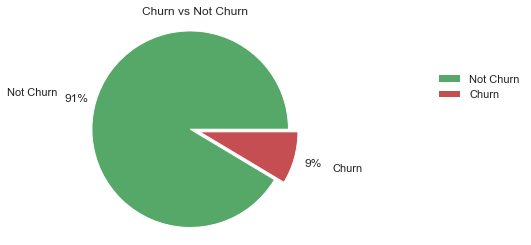

In [1916]:
fig, ax = plt.subplots()

labels = ['Not Churn','Churn']
explode=(0.1,0)

churn = telecom_churn_data_hv["Churn"].value_counts()
df = pd.DataFrame({'labels': churn.index,
                   'values': churn.values
                  })

ax.pie(churn.values, explode=explode, labels=labels,  
       colors=['g','r'], autopct='%1.0f%%', 
       shadow=False, startangle=0,   
       pctdistance=1.2,labeldistance=1.4)
ax.axis('equal')
ax.set_title("Churn vs Not Churn")
ax.legend(frameon=False, bbox_to_anchor=(1.5,0.8))

# Inferences
- Imbalanced class distribution.
- The number of observations belonging to one class is significantly lower than those belonging to the other class.
- In this situation, the predictive model developed using conventional machine learning algorithms could be biased and inaccurate.

**Challenges**
- Standard classifier algorithms like Decision Tree and Logistic Regression have a bias towards classes which have number of instances. They tend to only predict the majority class data. The features of the minority class are treated as noise and are often ignored. Thus, there is a high probability of misclassification of the minority class as compared to the majority class.

In [1917]:
print("Churn Percentage for High-value Customer is : {}%".format(round(len(telecom_churn_data_hv[telecom_churn_data_hv.Churn == 1])/telecom_churn_data_hv.shape[0] *100,2)))

Churn Percentage for High-value Customer is : 8.59%


In [1918]:
churn_month_col =  telecom_churn_data_hv.columns[telecom_churn_data_hv.columns.str.contains('_9')]
print(churn_month_col.tolist())

['onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9', 'vbc_3g_9', 'av_rech_amt_9', 'total_rech_num_data_9', 'total_rech_amt_data_9', 'total_rech_month_9', 'tot_call_mou_9', 'vol_data_mb_9']


In [1919]:
# drop all columns corresponding to the churn phase
telecom_churn_data_hv.drop(churn_month_col,axis=1,inplace=True)

# EDA

## Utility functions

In [2139]:
def plot_Churn_vs_NotChurn(colname,calltype):
    fig, ax = plt.subplots(figsize=(8,5))
    df=tele_churn_data_hv.groupby(['Churn'])[colname].mean().T
    plt.plot(df)
    ax.set_xticklabels(['Jun','Jul','Aug'])
    ## Add legend
    plt.legend(['Non-Churn', 'Churn'])
    # Add titles
    plt.title("Total "+calltype+" MOU  V/S Month", fontsize=14,family = "Comic Sans MS")
    plt.xlabel("Month",fontsize=14,family = "Comic Sans MS")
    plt.ylabel("Total. "+calltype+" MOU",fontsize=14,family = "Comic Sans MS")


In [2160]:
def plot_byChurnVol(colname,calltype):
    fig, ax = plt.subplots(figsize=(8,5))
    df=tele_churn_data_hv.groupby(['Churn'])[colname].mean().T
    plt.plot(df)
    ax.set_xticklabels(['Jun','Jul','Aug'])
    ## Add legend
    plt.legend(['Non-Churn', 'Churn'])
    # Add titles
    plt.title(calltype+" V/S Month", fontsize=14,family = "Comic Sans MS")
    plt.xlabel("Month",fontsize=14,family = "Comic Sans MS")
    plt.ylabel(calltype,fontsize=14,family = "Comic Sans MS")

In [1920]:
def bar_Churn_Vs_NotChurn(colname):
    fig = plt.figure(figsize=(13,7))

    not_churn = telecom_churn_data_hv[telecom_churn_data_hv["Churn"]==0][colname].value_counts().reset_index()
    not_churn["percentage"]  = (not_churn[colname]*100/not_churn[colname].sum())
    not_churn["legends"]        = "Not Churn"


    churn = telecom_churn_data_hv[telecom_churn_data_hv["Churn"]==1][colname].value_counts().reset_index()
    churn["percentage"] = (churn[colname]*100/churn[colname].sum())
    churn["legends"]    = "Churn"

    churn_status = pd.concat([not_churn,churn],axis=0)

    ax = sns.barplot("index","percentage",data=churn_status,hue="legends",palette=["g","r"])
    #plt.xticks(rotation = 20)
    plt.xlabel(colname)
    fig.set_facecolor("white")
    plt.title(colname + "percentage in data with respect to churn status")
    plt.show()

In [1921]:
def plot_box_chart(colname,df):
    plt.figure(figsize=(20,16))
    plt.subplot(2,3,1)
    sns.boxplot(data=df, y=colname+"_6",x="Churn",hue="Churn",
                showfliers=False,palette=("g",'b'))
    plt.subplot(2,3,2)
    sns.boxplot(data=df, y=colname+"_7",x="Churn",hue="Churn",
                showfliers=False,palette=("y",'r'))
    plt.subplot(2,3,3)
    sns.boxplot(data=df, y=colname+"_8",x="Churn",hue="Churn",
                showfliers=False,palette=("plasma"))
    plt.show()

# Derived variables
  1. aon_year - Age of Network based on year usage

In [1922]:
# Network Age information into a separate dataframe
# Bin the Network age data
telecom_churn_data_hv['aon_year'] = pd.cut(telecom_churn_data_hv['aon'],bins=range(0,telecom_churn_data_hv['aon'].max(),365),labels=range(0,int(round(telecom_churn_data_hv['aon'].max()/365))-1))
telecom_churn_data_hv.head(10)


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,Churn,aon_year
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0.0,0.0,0.0,1580,790,3638,1,2
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,2,3,0.0,354.0,207.0,437,603,123,0,0
13,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,...,0,3,0.0,0.0,207.0,507,253,720,0,7
16,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,...,0,0,0.0,0.0,0.0,570,348,160,0,1
17,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,4.76,4.81,0.00,...,0,0,0.0,0.0,0.0,816,0,30,0,1
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0.0,0.0,0.0,600,680,718,0,1
24,124.19,55.19,141.11,450.33,370.48,283.36,9.30,0.00,13.83,9.89,...,0,0,0.0,0.0,0.0,440,330,490,0,8
33,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,8,1,5285.0,20424.0,455.0,1063,2814,456,0,3
38,248.99,619.96,666.38,88.86,50.58,97.81,0.00,0.00,0.00,0.00,...,0,0,0.0,0.0,0.0,420,636,416,0,3
41,86.39,118.88,80.44,232.36,280.78,136.69,0.00,0.00,0.00,0.00,...,0,0,0.0,0.0,0.0,496,510,410,0,5


In [1923]:
telecom_churn_data_hv['aon'].describe()

count    29875.000000
mean      1263.485992
std        975.055837
min        180.000000
25%        480.000000
50%        912.000000
75%       1923.000000
max       4321.000000
Name: aon, dtype: float64

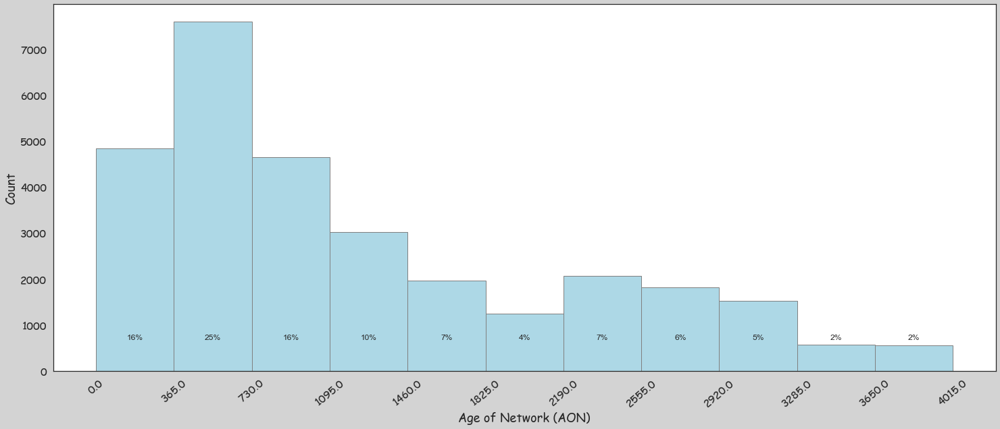

Percentage year wise  ['16%', '25%', '16%', '10%', '7%', '4%', '7%', '6%', '5%', '2%', '2%']


In [1924]:
fig, ax = plt.subplots(figsize=(25, 10))
fig.set_facecolor("lightgrey")
counts, bins, patches = ax.hist(telecom_churn_data_hv['aon'],
                        bins=range(0,telecom_churn_data_hv['aon'].max(),365),
                        facecolor='lightblue', edgecolor='gray')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)
# Set the xaxis's tick labels to be formatted with 1 decimal place...
ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))

l1 = []
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for count, x in zip(counts, bin_centers):
   
    # Label the percentages
    percent = '%0.0f%%' % (100 * float(count) / counts.sum())
    ax.annotate(percent, xy=(x,0.1), xycoords=('data', 'axes fraction'),
        xytext=(0, 0), textcoords='offset points', va='top', ha='center')
    l1.append(percent)

ax.set_xlabel('Age of Network (AON)', fontsize=18,family = "Comic Sans MS")
ax.set_ylabel('Count', fontsize=18,family = "Comic Sans MS")
plt.xticks(rotation = 40,fontsize=16,family="Comic Sans MS")
plt.yticks(fontsize=16,family="Comic Sans MS")
plt.show()
print('Percentage year wise ' ,l1)

# Inferences

- **67%** users have Age of network **less than 4 years**
- **25%** of users are in their **2nd year with network**
- **Average Age** of using network is **3.4 years**
- **Minimum age** of using network in **180 days**. Allowed age to switch the network.
- **18%** of users using network from **more than 7 years**

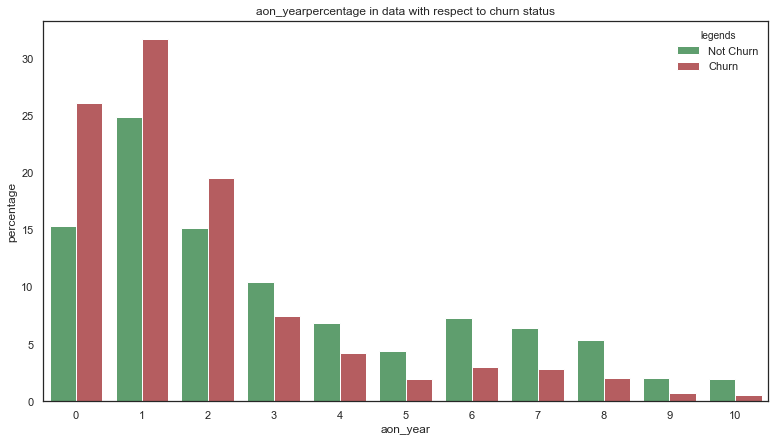

In [1925]:
bar_Churn_Vs_NotChurn('aon_year')

# Inferences

- The more a customers stays with the Operator, the churn rate is less. From the above graph it is clearly visible that churn rate reduces post 3 years.

In [1926]:
recharge_amt_col =  telecom_churn_data_hv.columns[telecom_churn_data_hv.columns.str.contains('rech_amt|rech_month')]
print(recharge_amt_col.tolist())

['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_6', 'av_rech_amt_7', 'av_rech_amt_8', 'total_rech_amt_data_6', 'total_rech_amt_data_7', 'total_rech_amt_data_8', 'total_rech_month_6', 'total_rech_month_7', 'total_rech_month_8']


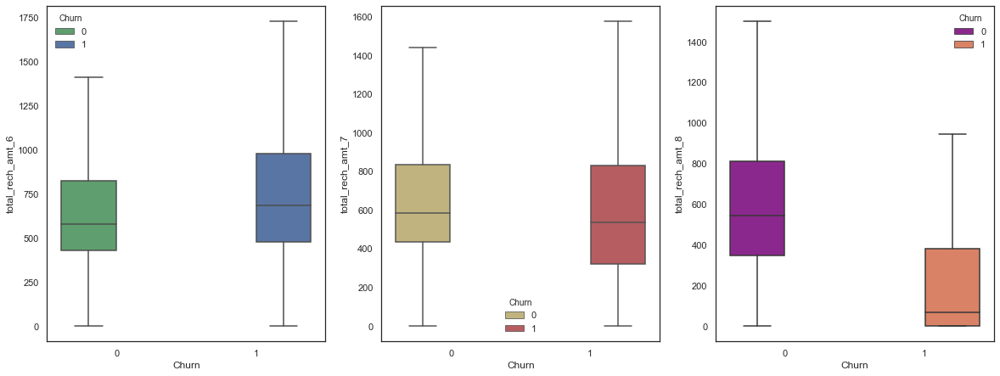

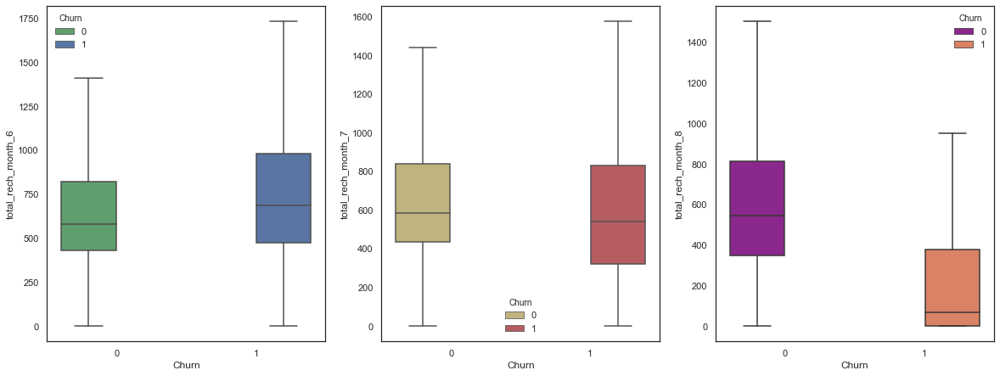

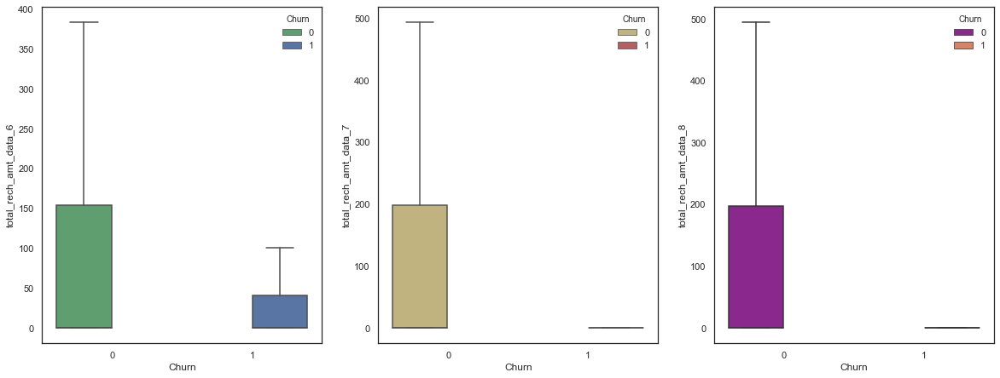

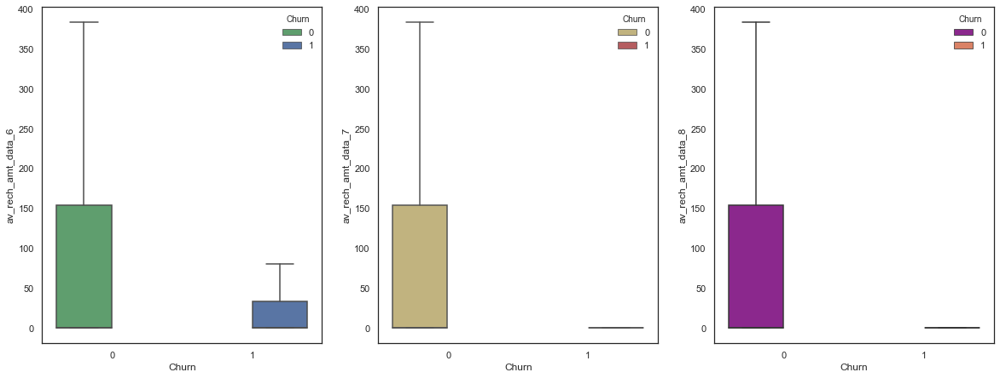

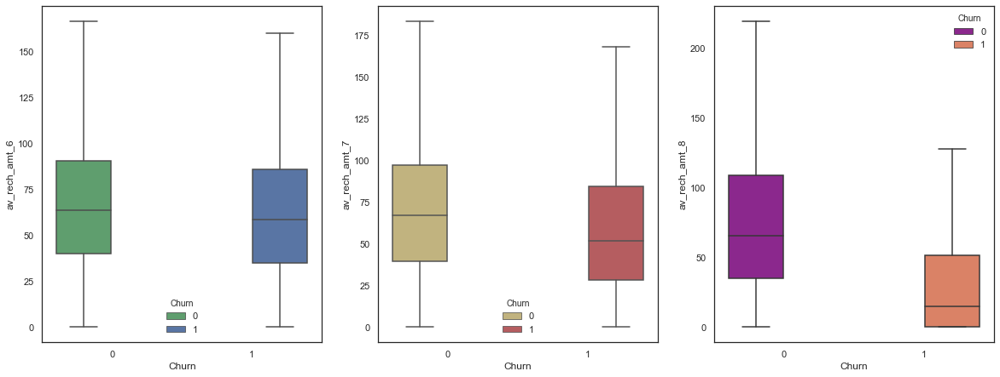

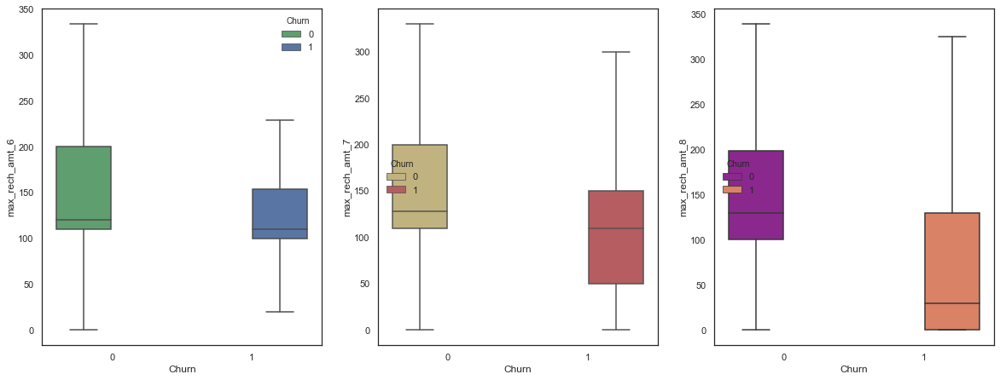

In [1927]:
recharge_amt_col_list = ['total_rech_amt', 'total_rech_month','total_rech_amt_data','av_rech_amt_data'
                         ,'av_rech_amt', 'max_rech_amt']
for item in recharge_amt_col_list:
    plot_box_chart(item,telecom_churn_data_hv)

# Inferences

- **total_rech_amt** for churned customers was dropped during September month.
- **total_rech_amt_data & av_rech_amt_data** is almost 0 for the September month for Churned customer
- **max_rech_amt & av_rech_amt** shows huge dip during September month for churned customers

In [1928]:
#Getting the last day recharge amount columns
last_day_rech_amt = telecom_churn_data_hv.columns[telecom_churn_data_hv.columns.str.contains('day')]
print(last_day_rech_amt)

Index(['last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8'], dtype='object')


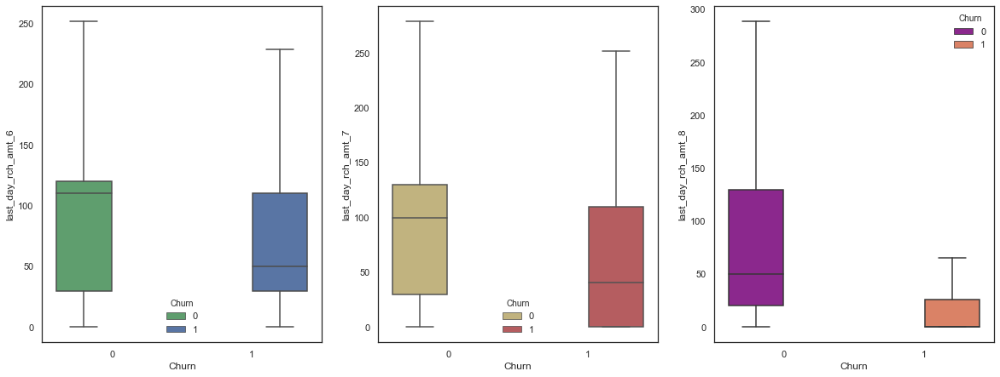

In [1929]:
plot_box_chart('last_day_rch_amt',telecom_churn_data_hv)

# Inferences 
- From above graph we can see huge drop in September month for **last day recharge amount** for churned customers.

In [1930]:
# creating copy of the final hv_user dataframe
tele_churn_data_hv = telecom_churn_data_hv.copy()

# removing the columns not required for modeling
tele_churn_data_hv.drop(['aon_year'], axis=1, inplace=True)

In [1931]:
tele_churn_data_hv.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_6,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,Churn
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0.0,0.0,0.0,1580,790,3638,1
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,2,3,0.0,354.0,207.0,437,603,123,0
13,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,...,0,0,3,0.0,0.0,207.0,507,253,720,0
16,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,...,0,0,0,0.0,0.0,0.0,570,348,160,0
17,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,4.76,4.81,0.00,...,0,0,0,0.0,0.0,0.0,816,0,30,0


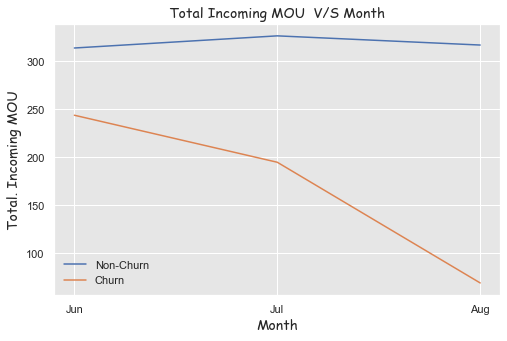

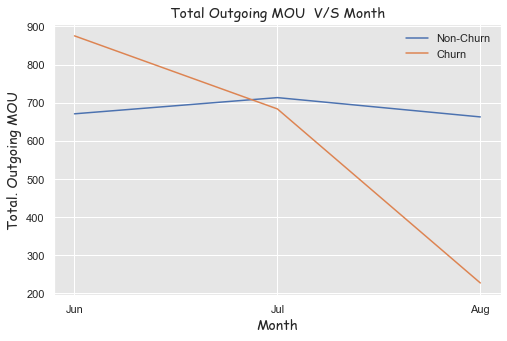

In [2140]:
ic_col = ['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8']
og_col = ['total_og_mou_6','total_og_mou_7','total_og_mou_8']
plot_Churn_vs_NotChurn(ic_col,'Incoming')
plot_Churn_vs_NotChurn(og_col,'Outgoing')

## Inferences
- From the above graph, initially, churner's outgoing usage was more than that of non-churners. Gradually it started dropping there outgoing usage
- For incoming calls also gradually drop there incoming call usage

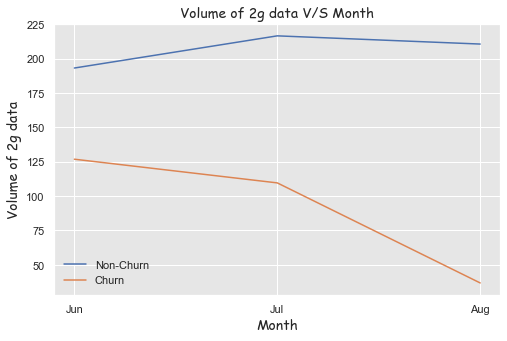

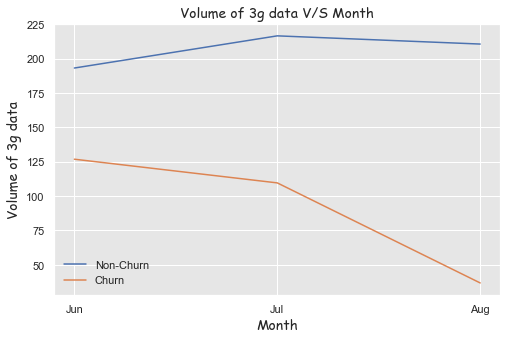

In [2161]:
vol_2g_col = ['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8']
vol_2g_col = ['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8']
plot_byChurnVol(vol_2g_col,'Volume of 2g data')
plot_byChurnVol(vol_2g_col,'Volume of 3g data')

In [1932]:
# Function for outliers detection
def outliers_graphs(df,colnames) :
    for colname in colnames:
        fig = plt.figure(figsize=(15, 25))
        fig.set_facecolor("lightgrey")
        plt.subplot(4,2,1)
        sns.boxplot(y =colname,x = 'Churn',data=tele_churn_data_hv)
        str1 = colname + " :- Boxplot for outliers detection"
        plt.title(str1, fontsize=14,family = "Comic Sans MS")
        plt.xlabel(colname, fontsize=12,family = "Comic Sans MS")
        
        plt.subplot(4,2,2)
        sns.distplot(tele_churn_data_hv[str(colname)])
        str2 = colname + " :- Distribution plot for skewness"
        plt.title(str2, fontsize=14,family = "Comic Sans MS")
        plt.xlabel(colname, fontsize=12,family = "Comic Sans MS")

In [1933]:
def distplot(df,colnames) :
    for colname in colnames:
        fig = plt.figure(figsize=(20, 16))
        fig.set_facecolor("lightgrey")
        plt.subplot(3,3,1)
        sns.distplot(tele_churn_data_hv[str(colname)],color='b')
        str2 = colname + " :- Distribution plot for skewness"
        plt.title(str2, fontsize=14,family = "Comic Sans MS")
        plt.xlabel(colname, fontsize=12,family = "Comic Sans MS")
        
        plt.subplot(3,3,2)
        sns.distplot(tele_churn_data_hv[str(colname)],color='g')
        str2 = colname + " :- Distribution plot for skewness"
        plt.title(str2, fontsize=14,family = "Comic Sans MS")
        plt.xlabel(colname, fontsize=12,family = "Comic Sans MS")
        
        plt.subplot(3,3,3)
        sns.distplot(tele_churn_data_hv[str(colname)],color='r')
        str2 = colname + " :- Distribution plot for skewness"
        plt.title(str2, fontsize=14,family = "Comic Sans MS")
        plt.xlabel(colname, fontsize=12,family = "Comic Sans MS")
        

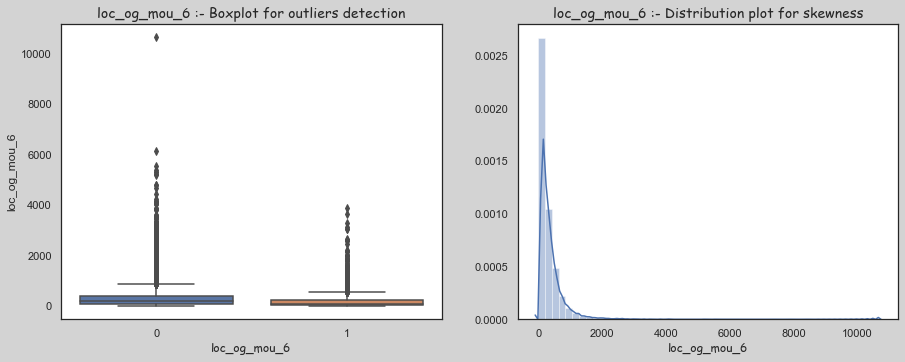

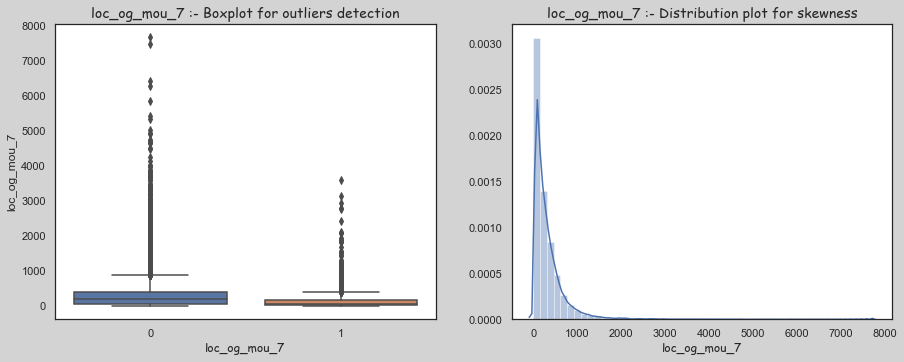

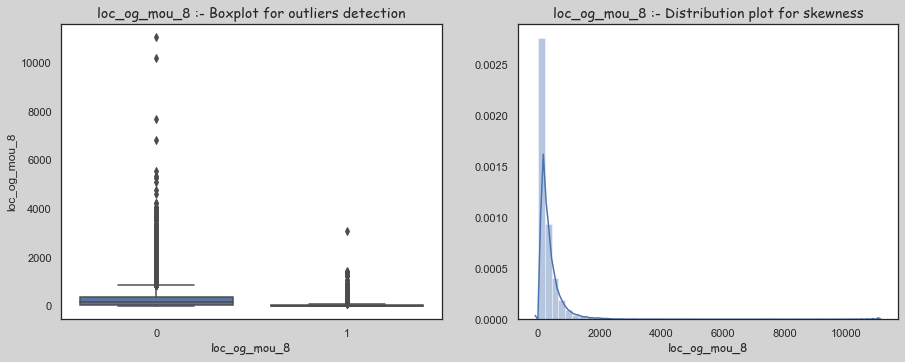

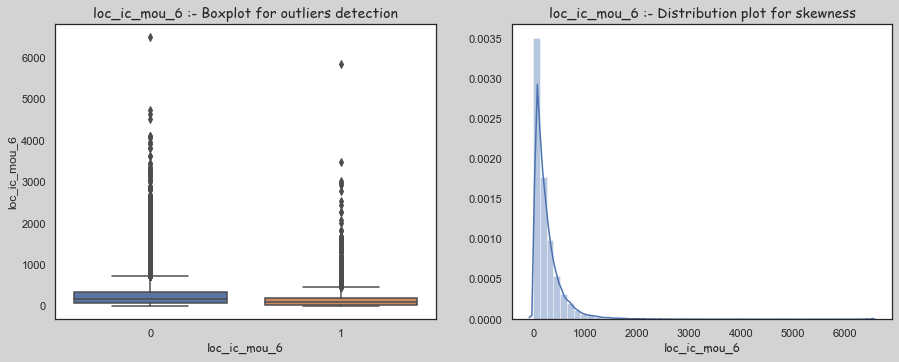

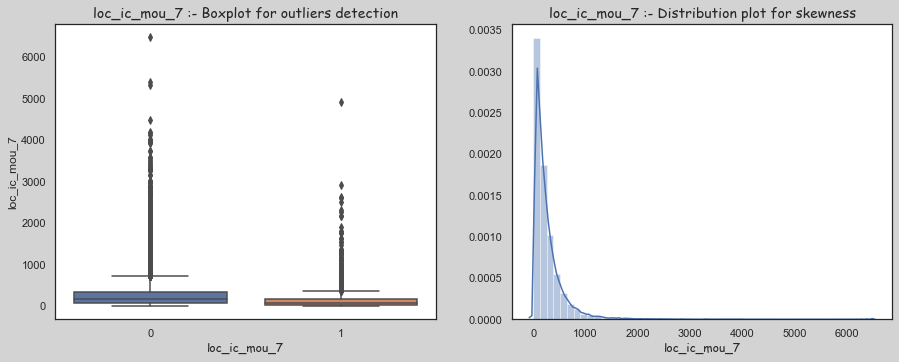

...

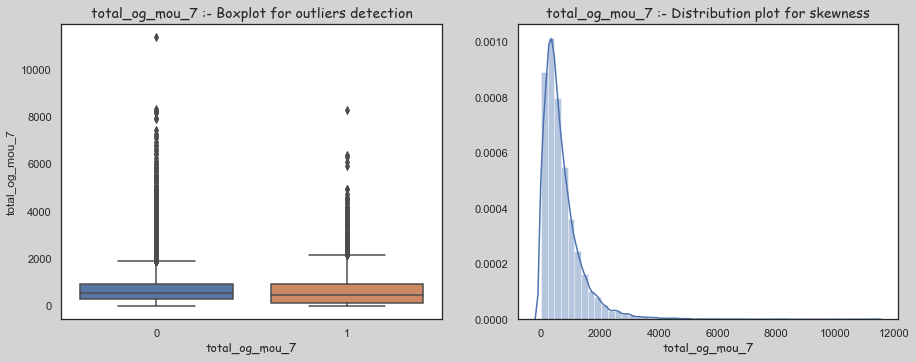

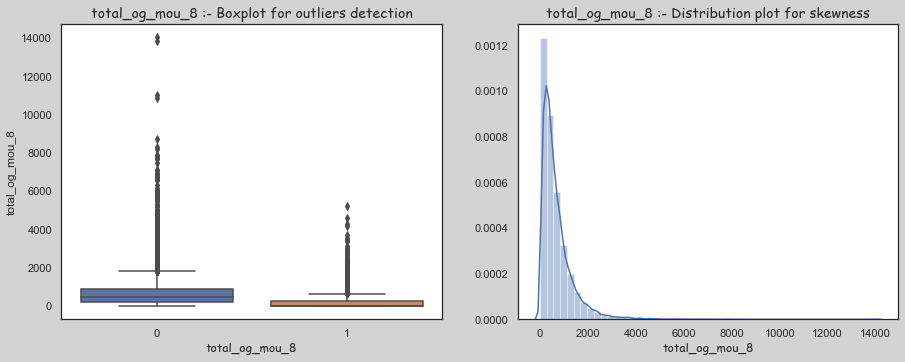

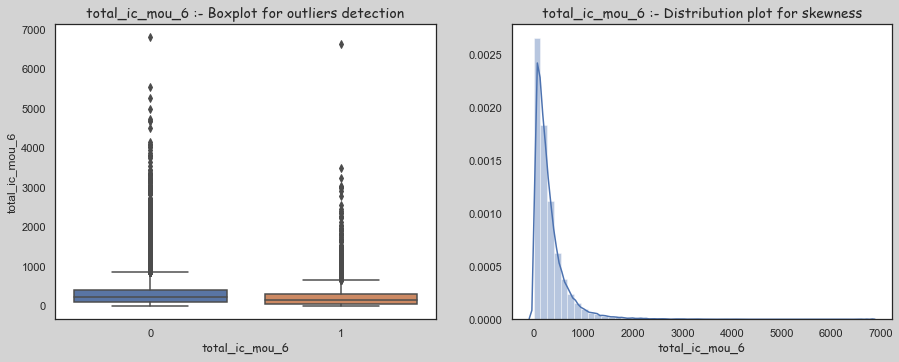

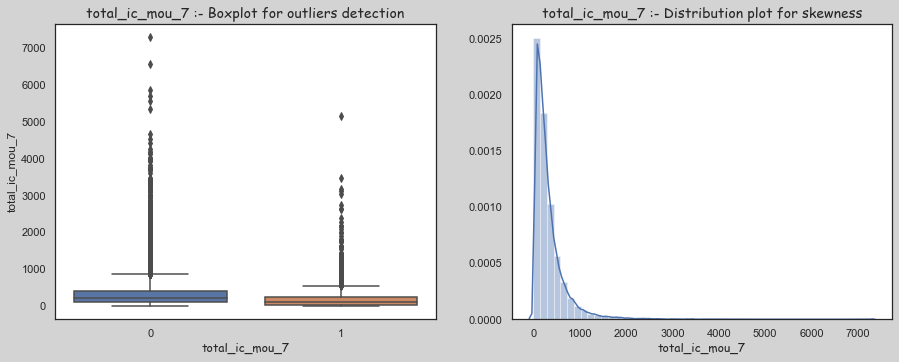

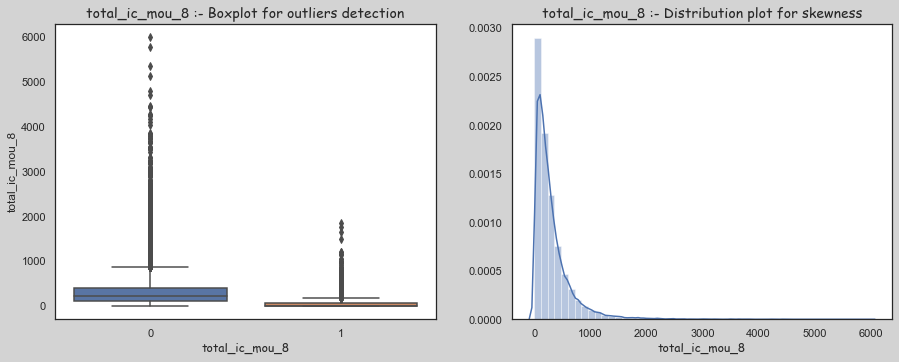

In [1934]:
# Checking Outliers and Skewness of the Numerical variable
colnames_num = ['loc_og_mou_6' ,'loc_og_mou_7','loc_og_mou_8', 'loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8',
'total_og_mou_6' , 'total_og_mou_7','total_og_mou_8' ,'total_ic_mou_6','total_ic_mou_7','total_ic_mou_8']
outliers_graphs(tele_churn_data_hv,colnames_num)

# Inferences
- Based on above graph **'loc_og_mou_','loc_ic_mou_','total_og_mou_','total_ic_mou_'** for all 3 months are having large no. of outliers. We can cap to 95% value for analysis.
- The plot seemed to be right-skewed for **'loc_og_mou_','loc_ic_mou_','total_og_mou_','total_ic_mou_'** for all 3 months

In [1935]:
# Sepearting Numerical Column info  
col_numeric = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Numeric Data
col_name_skewness=list(tele_churn_data_hv.select_dtypes(col_numeric).columns)

col_remove = ['loc_og_mou_6' ,'loc_og_mou_7','loc_og_mou_8', 'loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8',
'total_og_mou_6' , 'total_og_mou_7','total_og_mou_8' ,'total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','Churn']

for item in col_remove:
    col_name_skewness.remove(item)
print(col_name_skewness)

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'std_ic_t2t_mou

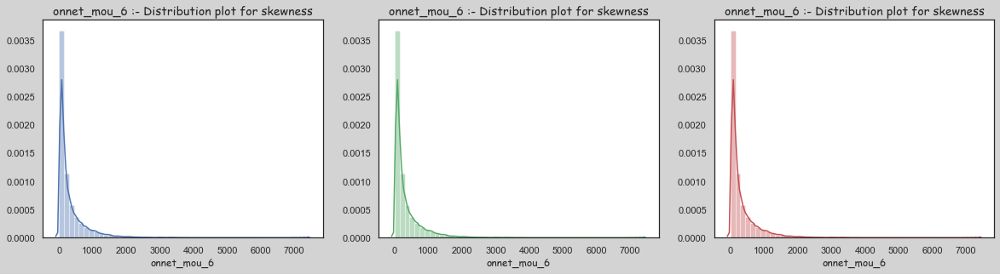

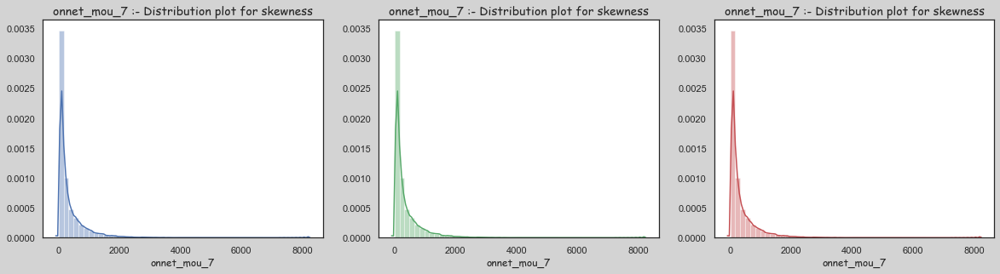

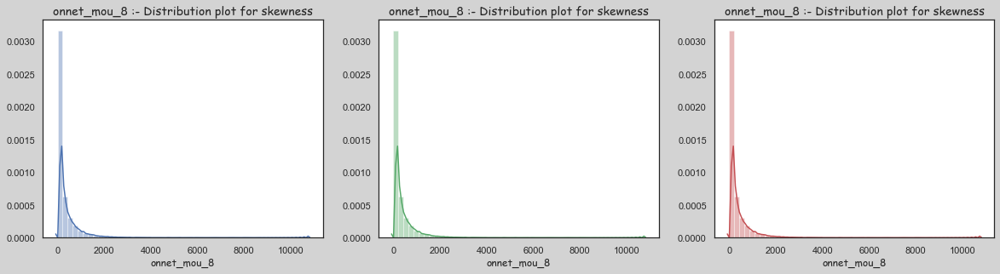

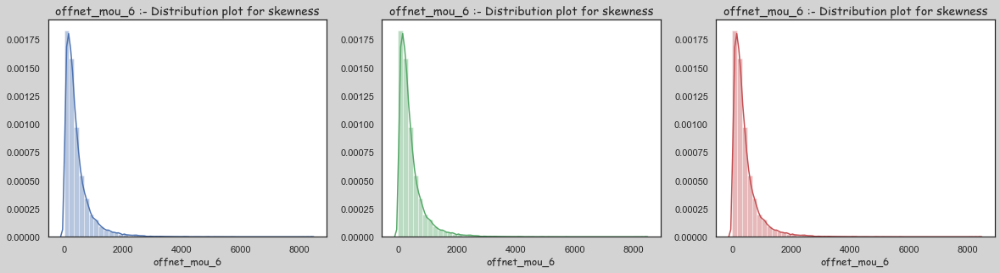

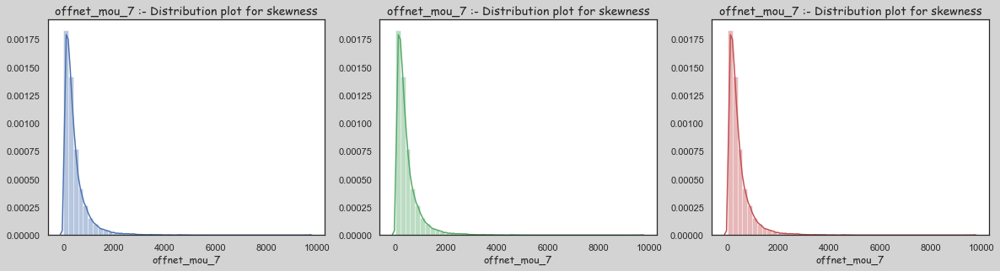

...

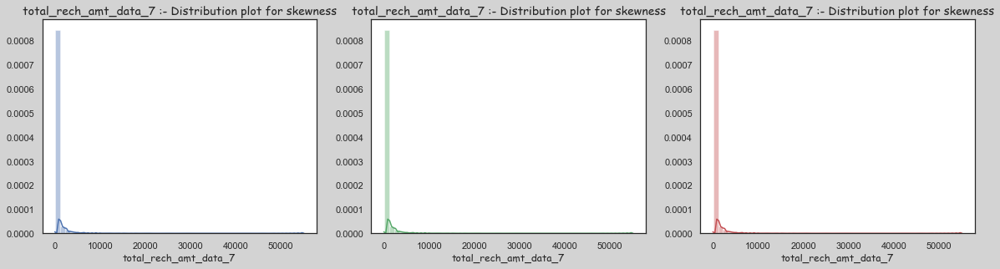

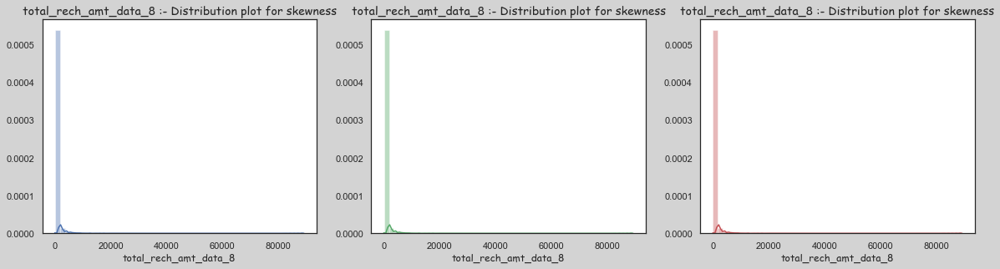

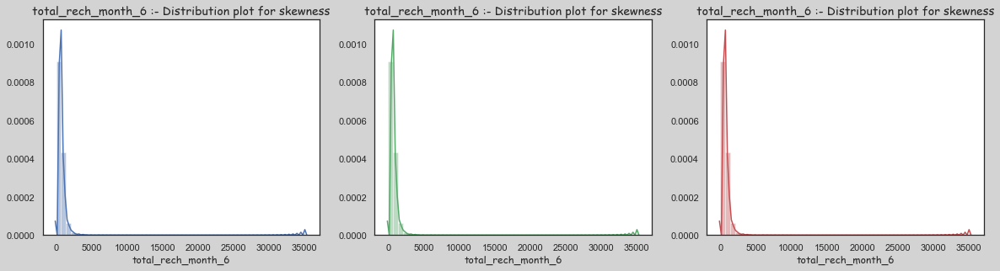

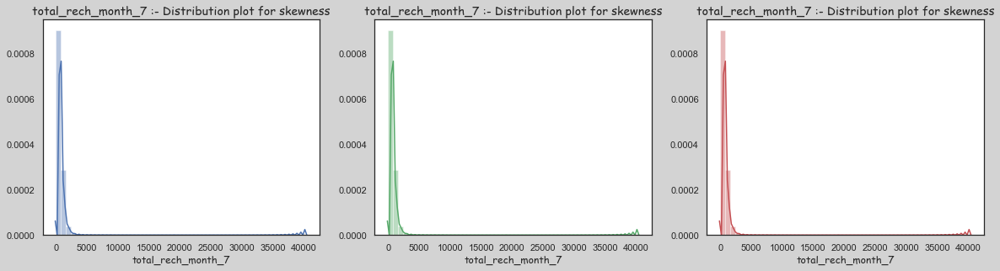

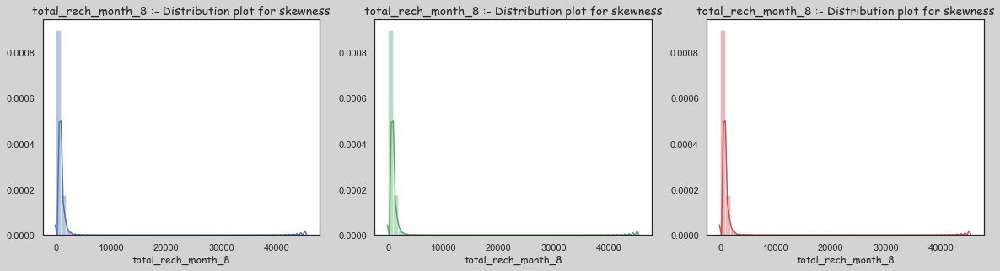

In [1936]:
distplot(tele_churn_data_hv,col_name_skewness)

# Inferences
- All nummerical values are looking Right skewed and hence using Quantile method to treat outliers.

In [1937]:
for num in col_name_skewness:
    Quant = tele_churn_data_hv[num].quantile([0.05,0.95]).values
    tele_churn_data_hv[num][tele_churn_data_hv[num] <= Quant[0]] = Quant[0]
    tele_churn_data_hv[num][tele_churn_data_hv[num] >= Quant[1]] = Quant[1]

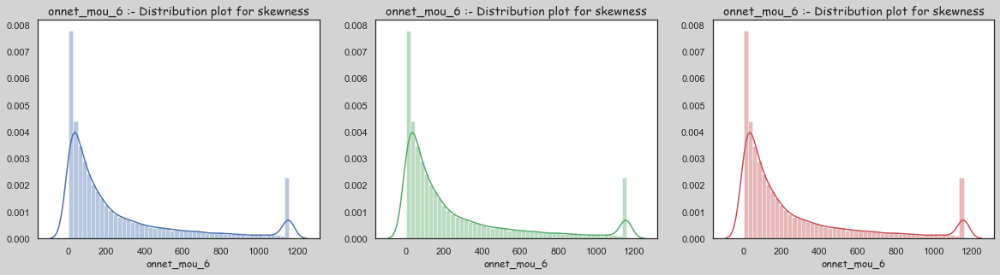

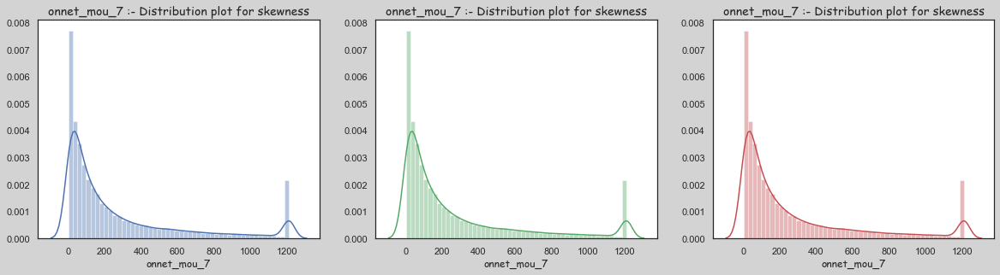

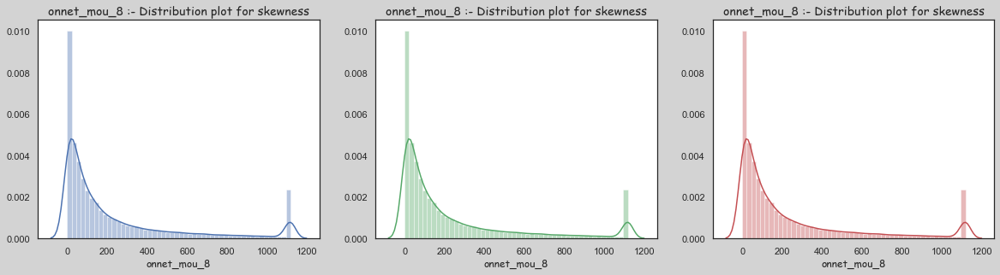

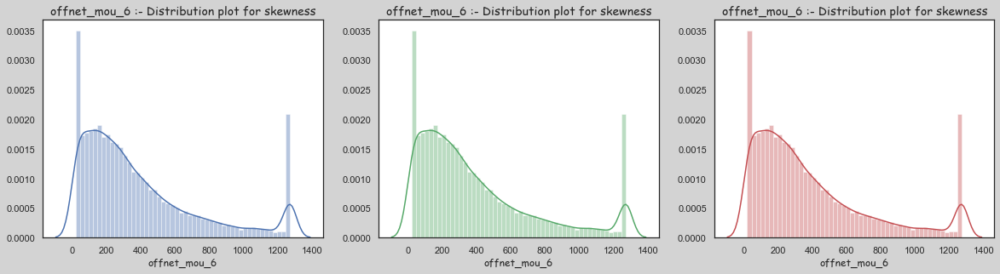

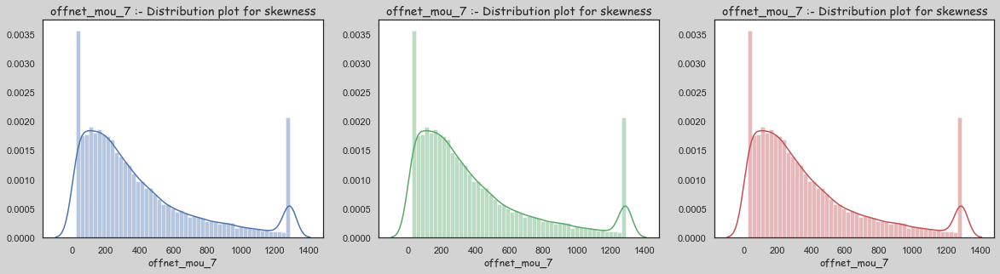

...

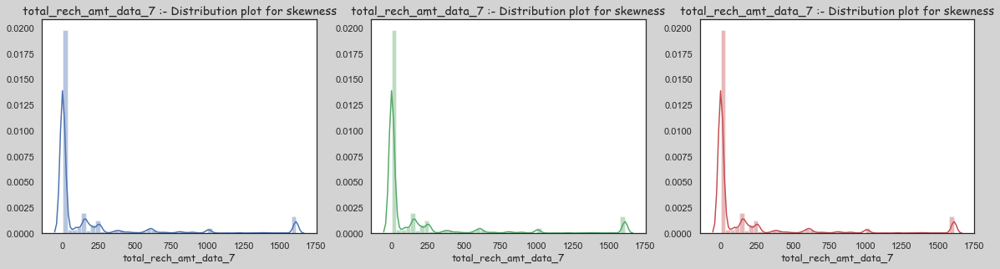

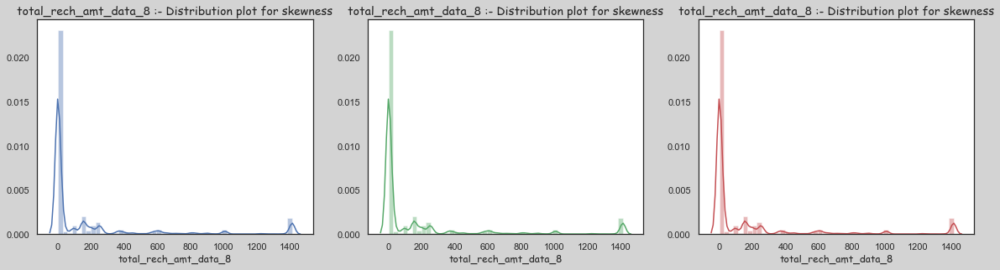

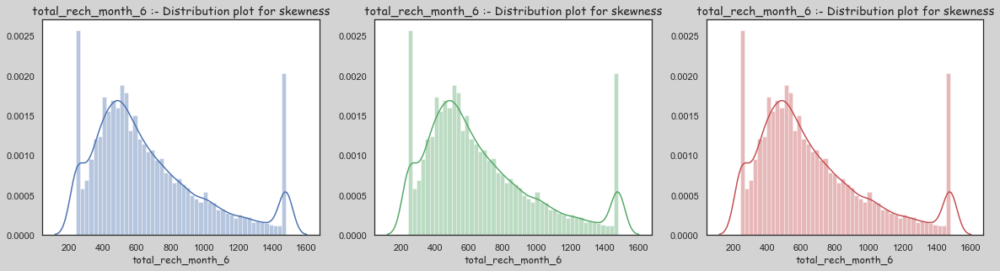

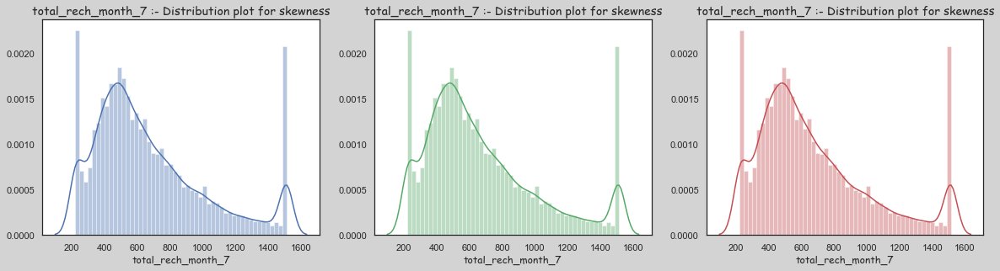

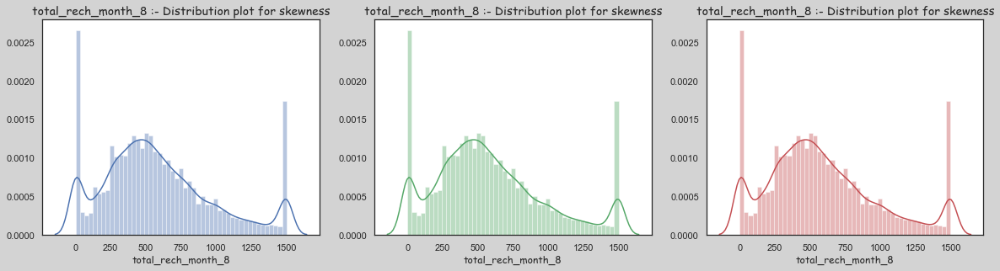

In [1938]:
distplot(tele_churn_data_hv,col_name_skewness)

In [1939]:
tele_churn_data_hv.shape

(29875, 158)

In [1940]:
tele_churn_data_hv.describe()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_6,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,Churn
count,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,...,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000,29875.000000
mean,263.899027,271.123206,232.712981,386.366186,390.970595,341.428211,9.024020,5.614004,5.640662,16.765145,...,0.742460,0.864301,0.856837,177.595894,211.314364,184.896887,671.572211,671.092820,582.743605,0.085858
std,321.810686,335.355470,306.893669,337.330122,343.580476,324.906763,23.922072,15.852200,15.760790,43.268543,...,1.177926,1.417309,1.406603,360.215770,425.217139,372.658482,328.012362,338.995444,389.443421,0.280159
min,2.440000,2.380000,0.000000,20.830000,22.224000,0.230000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,240.700000,221.000000,0.000000,0.000000
25%,41.140000,41.030000,27.080000,137.360000,135.750000,95.760000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,435.000000,429.000000,310.000000,0.000000
50%,126.040000,125.740000,99.730000,282.960000,282.810000,241.790000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,586.000000,584.000000,520.000000,0.000000
75%,354.640000,361.155000,298.695000,524.890000,534.305000,484.210000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,154.000000,184.000000,164.000000,840.000000,837.000000,792.000000,0.000000
max,1155.925000,1209.800000,1116.281000,1273.289000,1289.264000,1189.755000,94.702000,63.667000,63.216000,168.775000,...,4.000000,5.000000,5.000000,1372.000000,1611.000000,1414.000000,1481.000000,1514.000000,1498.300000,1.000000


# Data Preparation

- Encoding categorical features
- Splitting the Data into Training and Testing Sets
- Rescaling the features

In [1941]:
# Removing the datatime columns before PCA
dateTimeCols = list(tele_churn_data_hv.select_dtypes(include=['datetime64']).columns)
tele_churn_data_hv.drop(dateTimeCols, axis=1, inplace=True)

In [1942]:
# Divide the data into Numeric and categorical data  
col_numeric = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Numeric Data
numeric_data=list(telecom_churn_data_hv[list(telecom_churn_data_hv.select_dtypes(col_numeric).columns)])
numeric_data.remove('Churn')
print(numeric_data)

# Categorical Data
categorical_data=telecom_churn_data_hv[list(telecom_churn_data_hv.select_dtypes(exclude=col_numeric).columns)]
categorical_data.columns

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_m

Index(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8', 'aon_year'],
      dtype='object')

In [1943]:
tele_churn_data_hv_cat = tele_churn_data_hv.select_dtypes(include = object)
tele_churn_data_hv_cat.head(10)

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
7,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
8,Unknown,0,0,Unknown,1,1
13,Unknown,Unknown,0,Unknown,Unknown,1
16,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
17,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
21,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
24,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
33,1,1,0,1,1,1
38,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
41,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown


In [1944]:
tele_churn_data_hv_num = tele_churn_data_hv.select_dtypes(exclude = "object")
tele_churn_data_hv_num.head(10)

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_6,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,Churn
7,57.840,54.68,52.29,453.43,567.160,325.91,16.23,33.490,31.640,23.74,...,0,0,0,0.0,0.0,0.0,1481.0,790,1498.3,1
8,413.690,351.03,35.08,94.66,80.630,136.48,0.00,0.000,0.000,0.00,...,0,2,3,0.0,354.0,207.0,437.0,603,123.0,0
13,501.760,108.39,534.24,413.31,119.280,482.46,23.53,63.667,63.216,7.98,...,0,0,3,0.0,0.0,207.0,507.0,253,720.0,0
16,50.510,74.01,70.61,296.29,229.740,162.76,0.00,2.830,0.000,0.00,...,0,0,0,0.0,0.0,0.0,570.0,348,160.0,0
17,1155.925,9.28,7.79,61.64,22.224,5.54,0.00,4.760,4.810,0.00,...,0,0,0,0.0,0.0,0.0,816.0,221,30.0,0
21,102.410,132.11,85.14,757.93,896.680,983.39,0.00,0.000,0.000,0.00,...,0,0,0,0.0,0.0,0.0,600.0,680,718.0,0
24,124.190,55.19,141.11,450.33,370.480,283.36,9.30,0.000,13.830,9.89,...,0,0,0,0.0,0.0,0.0,440.0,330,490.0,0
33,2.440,2.38,0.00,20.83,22.224,0.23,0.00,0.000,0.000,0.00,...,4,5,1,1372.0,1611.0,455.0,1063.0,1514,456.0,0
38,248.990,619.96,666.38,88.86,50.580,97.81,0.00,0.000,0.000,0.00,...,0,0,0,0.0,0.0,0.0,420.0,636,416.0,0
41,86.390,118.88,80.44,232.36,280.780,136.69,0.00,0.000,0.000,0.00,...,0,0,0,0.0,0.0,0.0,496.0,510,410.0,0


## Encoding categorical features

In [1945]:
m1 = pd.get_dummies(tele_churn_data_hv['night_pck_user_6'], prefix = 'night_pck_user_6',drop_first = True)
m2 = m1.drop('night_pck_user_6_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m1],axis =1 )

m3 = pd.get_dummies(tele_churn_data_hv['night_pck_user_7'], prefix = 'night_pck_user_7',drop_first = True)
m4 = m3.drop('night_pck_user_7_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m4], axis = 1)

m5 = pd.get_dummies(tele_churn_data_hv['night_pck_user_8'], prefix = 'night_pck_user_8',drop_first = True)
m6 = m5.drop('night_pck_user_8_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m6], axis = 1)

m7 = pd.get_dummies(tele_churn_data_hv['fb_user_6'], prefix = 'fb_user_6',drop_first = True)
m8 = m7.drop('fb_user_6_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m7], axis = 1)

m9 = pd.get_dummies(tele_churn_data_hv['fb_user_7'], prefix = 'fb_user_7',drop_first = True)
m10 = m9.drop('fb_user_7_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m10], axis = 1)

m11 = pd.get_dummies(tele_churn_data_hv['fb_user_8'], prefix = 'fb_user_8',drop_first = True)
m12 = m11.drop('fb_user_8_Unknown',axis = 1, inplace = True)
tele_churn_data_hv = pd.concat([tele_churn_data_hv,m12], axis = 1)

In [1946]:
delete_Cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

for colname in delete_Cols:
    tele_churn_data_hv.drop(colname,axis = 1, inplace = True)

In [1947]:
tele_churn_data_hv.shape

(29875, 151)

In [1948]:
tele_churn_data_hv.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29875 entries, 7 to 99997
Columns: 151 entries, onnet_mou_6 to fb_user_6_1.0
dtypes: float64(120), int32(3), int64(26), uint8(2)
memory usage: 35.2 MB


In [1949]:
tele_churn_data_hv.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,Churn,night_pck_user_6_1.0,fb_user_6_1.0
7,57.840,54.68,52.29,453.43,567.160,325.91,16.23,33.490,31.640,23.74,...,0,0.0,0.0,0.0,1481.0,790,1498.3,1,0,0
8,413.690,351.03,35.08,94.66,80.630,136.48,0.00,0.000,0.000,0.00,...,3,0.0,354.0,207.0,437.0,603,123.0,0,0,0
13,501.760,108.39,534.24,413.31,119.280,482.46,23.53,63.667,63.216,7.98,...,3,0.0,0.0,207.0,507.0,253,720.0,0,0,0
16,50.510,74.01,70.61,296.29,229.740,162.76,0.00,2.830,0.000,0.00,...,0,0.0,0.0,0.0,570.0,348,160.0,0,0,0
17,1155.925,9.28,7.79,61.64,22.224,5.54,0.00,4.760,4.810,0.00,...,0,0.0,0.0,0.0,816.0,221,30.0,0,0,0


## Splitting the Data into Training and Testing Sets

In [1950]:
#putting features variables in X
X = tele_churn_data_hv.drop(['Churn'], axis=1)

#putting response variables in Y
y = tele_churn_data_hv['Churn']    

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [1951]:
X.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,night_pck_user_6_1.0,fb_user_6_1.0
7,57.840,54.68,52.29,453.43,567.160,325.91,16.23,33.490,31.640,23.74,...,0,0,0.0,0.0,0.0,1481.0,790,1498.3,0,0
8,413.690,351.03,35.08,94.66,80.630,136.48,0.00,0.000,0.000,0.00,...,2,3,0.0,354.0,207.0,437.0,603,123.0,0,0
13,501.760,108.39,534.24,413.31,119.280,482.46,23.53,63.667,63.216,7.98,...,0,3,0.0,0.0,207.0,507.0,253,720.0,0,0
16,50.510,74.01,70.61,296.29,229.740,162.76,0.00,2.830,0.000,0.00,...,0,0,0.0,0.0,0.0,570.0,348,160.0,0,0
17,1155.925,9.28,7.79,61.64,22.224,5.54,0.00,4.760,4.810,0.00,...,0,0,0.0,0.0,0.0,816.0,221,30.0,0,0


In [1952]:
y.head()

7     1
8     0
13    0
16    0
17    0
Name: Churn, dtype: int64

In [1953]:
X_train[numeric_data].describe()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,av_rech_amt_8,total_rech_num_data_6,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8
count,20912.000000,20912.000000,20912.000000,20912.000000,20912.000000,20912.000000,20912.000000,20912.00000,20912.000000,20912.000000,...,20912.000000,20912.000000,20912.000000,20912.000000,20912.00000,20912.000000,20912.000000,20912.000000,20912.000000,20912.000000
mean,264.300062,270.929294,232.180950,389.534780,392.634659,342.507818,8.987397,5.54788,5.527711,16.719654,...,74.851219,0.744931,0.863380,0.848891,177.53204,211.368646,183.685564,673.197140,670.575842,581.322145
std,322.687637,335.992407,306.881447,339.874129,345.423811,325.909668,23.884161,15.72140,15.562023,43.246342,...,57.614305,1.174292,1.414631,1.393785,358.61318,425.179709,371.400548,328.287784,339.192073,389.001453
min,2.440000,2.380000,0.000000,20.830000,22.224000,0.230000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,240.700000,221.000000,0.000000
25%,41.130000,40.555000,26.460000,138.375000,136.220000,96.155000,0.000000,0.00000,0.000000,0.000000,...,31.060000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,438.000000,427.000000,310.000000
50%,125.135000,124.790000,98.820000,285.525000,284.190000,243.110000,0.000000,0.00000,0.000000,0.000000,...,61.600000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,587.000000,585.000000,520.000000
75%,357.042500,361.270000,297.977500,527.200000,536.177500,487.080000,0.000000,0.00000,0.000000,0.000000,...,105.000000,1.000000,1.000000,1.000000,154.00000,184.000000,154.000000,840.000000,840.000000,791.000000
max,1155.925000,1209.800000,1116.281000,1273.289000,1289.264000,1189.755000,94.702000,63.66700,63.216000,168.775000,...,220.430000,4.000000,5.000000,5.000000,1372.00000,1611.000000,1414.000000,1481.000000,1514.000000,1498.300000


## Rescaling the Features
As per above table, features are varying in different ranges. This will be problem. It is important that we rescale the feature such that thay have a comparable scales. This can lead us time consuming during model evaluation.

So it is advices to Standardization and normalization so that units of coefficients obtained are in same scale. Two common ways of rescaling are

- Standardization (mean-0, sigma-1)
- Min-Max scaling (Normization)

In this case we are using Min-Max scaling

In [1954]:
# Rescaling the features as it is sensitive to the scales of the features
scaler = MinMaxScaler()

In [1955]:
# Apply scaler() to all numerical columns

# fitting and transforming the scaler on train
X_train[numeric_data] = scaler.fit_transform(X_train[numeric_data])

In [1956]:
# transforming the train using the already fit scaler
X_test[numeric_data] = scaler.transform(X_test[numeric_data])

In [1957]:
X_test.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,total_rech_num_data_7,total_rech_num_data_8,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_month_6,total_rech_month_7,total_rech_month_8,night_pck_user_6_1.0,fb_user_6_1.0
25632,0.009571,0.028722,0.005697,0.220965,0.481347,0.207402,0.000000,0.0,0.0,0.000000,...,0.2,0.2,0.0,0.060832,0.069307,0.060711,0.306265,0.208903,0,0
8339,1.000000,1.000000,1.000000,0.163079,0.144973,0.196759,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.343707,0.576953,0.531936,0,0
18512,0.046815,0.076220,0.040922,0.317535,0.149329,0.061646,0.000000,0.0,0.0,0.000000,...,0.0,0.2,0.0,0.000000,0.012023,0.993550,0.661253,0.355737,0,0
99963,0.089919,0.064849,0.057253,0.726036,0.517202,0.857914,0.000000,0.0,0.0,0.000000,...,0.2,0.0,0.0,0.010552,0.000000,0.367089,0.358082,0.565307,0,0
48537,0.171134,0.031729,0.030154,0.256903,0.203353,0.085202,0.146354,0.0,0.0,0.104222,...,0.0,0.0,0.0,0.000000,0.000000,0.316294,0.200309,0.126810,0,0


## Utility functions used for the Modelling

In [2105]:
def modelMetrics(churn_actual,churn_pred):

    #Confusion Metrics
    confusion_metrics = metrics.confusion_matrix(churn_actual, churn_pred)

    # True Positive 
    TP = confusion_metrics[1,1] 
    # True Negatives
    TN = confusion_metrics[0,0]
    # False positives
    FP = confusion_metrics[0,1]
    # False negatives
    FN = confusion_metrics[1,0]

    print("*****Different metrics values for the Model*****")
    print("\nRoc_auc_score of the Model: {:2.4f}".format(metrics.roc_auc_score(churn_actual,churn_pred)))
    
    # Sensitivity of the Model
    print('\nSensitivity or Recall of the Model : {:2.4f}'.format(TP / float(TP+FN)))
    
    # Specificity of the Model
    print('Specificity of the Model: {:2.4f}'.format(TN / float(TN+FP)))
    
    # False postive rate - Predicting churn when customer does not have churned
    print('\nFalse Positive Rate: {:2.4f}'.format(FP/ float(TN+FP)))
    
    # Positive predictive value 
    print('Positive predictive value: {:2.4f}'.format(TP / float(TP+FP)))
    
    # Negative predictive value
    print('Negative Predictive value: {:2.4f}'.format(TN / float(TN+ FN)))
    
    # Negative predictive value
    print('Accuracy value: {:2.4f}'.format((TN + TP)/ float(TN+ FN+TP+FP)))
    
    # Precision score value 
    print('\nPrecision score value: {:2.4f}'.format(metrics.precision_score(churn_actual, churn_pred )))

In [1959]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

In [1960]:
def OptimalCutoff(y_pred_final,x1,y1):
    # Let's create columns with different probability cutoffs 
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        y_pred_final[i]= y_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)

    # Calculating accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['Probability','Accuracy','Sensitivity','Specificity'])

    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        cm1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final[i] )
        total1=sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1
        specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
    print(cutoff_df)
    
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='Probability', y=['Accuracy','Sensitivity','Specificity'])
    plt.vlines(x=x1,ymax=0.9,ymin=0.0,color="g",linestyles="--")
    plt.hlines(y=y1,xmax=0.9,xmin=0.0,color="b",linestyles="--")
    plt.show()

## Applying PCA on data

PCA - Principal component analysis (PCA) is one of the most commonly used dimensionality reduction techniques to improve model performance

In [1961]:
pca = PCA(svd_solver='randomized',random_state = 42)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [1962]:
pca.components_

array([[-5.99701072e-02, -6.11622632e-02, -4.97204793e-02, ...,
         3.92615251e-02,  7.77472126e-03,  2.97736316e-01],
       [-3.00432358e-02, -3.03142357e-02, -1.41327240e-02, ...,
         6.66393340e-02, -1.19012841e-02, -8.97613486e-02],
       [ 1.36693058e-01,  1.66106249e-01,  1.75322676e-01, ...,
         2.04268262e-01,  3.36300378e-03, -5.39787591e-03],
       ...,
       [ 0.00000000e+00,  2.10373738e-16,  8.58228652e-18, ...,
        -5.59742451e-15, -1.06335023e-16, -9.70949250e-17],
       [ 0.00000000e+00, -1.84918987e-16, -1.07749568e-16, ...,
        -7.13949734e-16, -9.31937651e-17,  9.76569677e-17],
       [ 0.00000000e+00,  4.65509381e-17, -2.32297547e-16, ...,
        -1.45214667e-16, -1.01881160e-16,  2.06839008e-17]])

In [1963]:
pca.explained_variance_ratio_

array([1.65264125e-01, 8.51793784e-02, 7.21384857e-02, 5.70574714e-02,
       3.91184379e-02, 3.43403453e-02, 2.87226374e-02, 2.84520044e-02,
       2.49205260e-02, 2.21858063e-02, 1.92728743e-02, 1.87197063e-02,
       1.80382666e-02, 1.68902994e-02, 1.64774711e-02, 1.48251281e-02,
       1.27268856e-02, 1.19664983e-02, 1.14959816e-02, 1.09825266e-02,
       1.07070400e-02, 1.02222342e-02, 9.77482130e-03, 8.52702848e-03,
       8.21277110e-03, 7.77897633e-03, 7.64454926e-03, 7.33981189e-03,
       7.14415220e-03, 7.05628424e-03, 6.73948666e-03, 6.51034146e-03,
       6.30995836e-03, 6.24569343e-03, 5.93615434e-03, 5.82797714e-03,
       5.57704298e-03, 5.50846115e-03, 5.37126809e-03, 5.13096938e-03,
       5.09044662e-03, 4.93799187e-03, 4.75340904e-03, 4.70780647e-03,
       4.35965009e-03, 4.20730852e-03, 4.13911275e-03, 4.08034917e-03,
       3.91369693e-03, 3.75940911e-03, 3.69017934e-03, 3.66913910e-03,
       3.49294850e-03, 3.19125333e-03, 3.10993007e-03, 3.08892506e-03,
      

Text(0.5, 1.0, 'Variance Ratio for each PCA component')

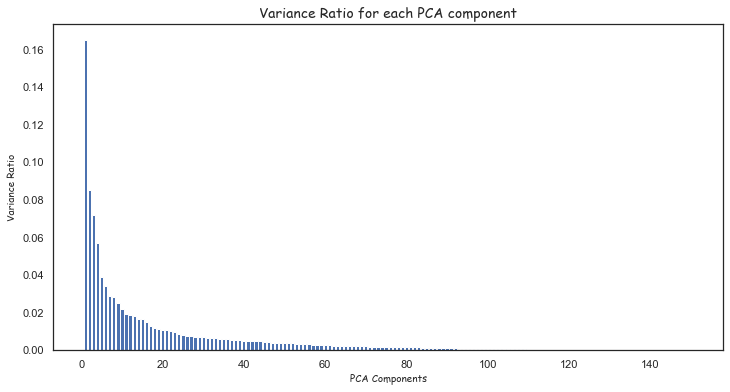

In [1964]:
# Variance Ratio bar plot for each PCA components.
fig = plt.figure(figsize = (12,6))
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontsize=10,family = "Comic Sans MS")
plt.ylabel("Variance Ratio",fontsize=10,family = "Comic Sans MS")
plt.title("Variance Ratio for each PCA component",fontsize=14,family = "Comic Sans MS")

Text(0.5, 1.0, 'Scree plot to Visualize Cumulative Variance')

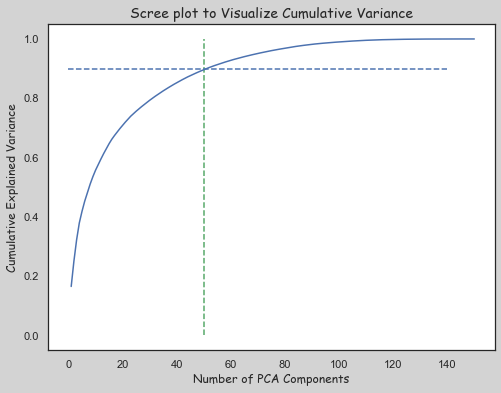

In [1965]:
fig = plt.figure(figsize = (8,6))
fig.set_facecolor("lightgrey")
var_cumu = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.vlines(x=50,ymax=1,ymin=0.0,color="g",linestyles="--")
plt.hlines(y=0.9,xmax=140,xmin=0.0,color="b",linestyles="--")

plt.xlabel('Number of PCA Components',fontsize=12,family = "Comic Sans MS")
plt.ylabel('Cumulative Explained Variance',fontsize=12,family = "Comic Sans MS")
plt.title("Scree plot to Visualize Cumulative Variance",fontsize=14,family = "Comic Sans MS")

## Inference
- From the above it is clear that first 50 principal components can well explain around 90% varaiance. Hence we will use them clustering process.

In [1966]:
pca.explained_variance_ratio_[:50]

array([0.16526412, 0.08517938, 0.07213849, 0.05705747, 0.03911844,
       0.03434035, 0.02872264, 0.028452  , 0.02492053, 0.02218581,
       0.01927287, 0.01871971, 0.01803827, 0.0168903 , 0.01647747,
       0.01482513, 0.01272689, 0.0119665 , 0.01149598, 0.01098253,
       0.01070704, 0.01022223, 0.00977482, 0.00852703, 0.00821277,
       0.00777898, 0.00764455, 0.00733981, 0.00714415, 0.00705628,
       0.00673949, 0.00651034, 0.00630996, 0.00624569, 0.00593615,
       0.00582798, 0.00557704, 0.00550846, 0.00537127, 0.00513097,
       0.00509045, 0.00493799, 0.00475341, 0.00470781, 0.00435965,
       0.00420731, 0.00413911, 0.00408035, 0.0039137 , 0.00375941])

In [1967]:
from sklearn.decomposition import IncrementalPCA
inc_pca = IncrementalPCA(n_components=50)

In [1968]:
X_train_pca = inc_pca.fit_transform(X_train) 
X_train_pca.shape

(20912, 50)

In [1969]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(X_train_pca.transpose())
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.004294020215827118 , min corr:  -0.005830587150434107


In [1970]:
corrmat.shape

(50, 50)

In [1971]:
X_test_pca = inc_pca.transform(X_test)
X_test_pca.shape

(8963, 50)

# Modelling

## For the prediction of churn customers we will be fitting variety of models and select one which is the best predictor of churn. Models trained are,

1. Logistic Regression
2. Random Forest
3. Decision Tree

## 1. Logistic Regression

Training the Model using Train Data

In [1972]:
#Training the model on the train data
lr_pca = LogisticRegression(class_weight='balanced')

In [1973]:
lr_pca.fit(X_train_pca,y_train)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [1974]:
X_train_pred = lr_pca.predict(X_train_pca)
X_train_predprob = lr_pca.predict_proba(X_train_pca)[:,1]

In [1975]:
X_train_pred[:10]

array([0, 1, 0, 0, 1, 0, 0, 0, 0, 1], dtype=int64)

In [1976]:
X_train_predprob[:10]

array([0.12694463, 0.93787561, 0.25633146, 0.2125771 , 0.79082329,
       0.10939882, 0.0244739 , 0.01633898, 0.23250824, 0.68570318])

In [1977]:
print("Model Summary on Training Set")
print("\nAccuracy : %.4g" % metrics.roc_auc_score(y_train, X_train_pred))
print("Recall/Sensitivity : %.4g" % metrics.recall_score(y_train, X_train_pred))
print("AUC Score (Train): %f" % metrics.roc_auc_score(y_train, X_train_predprob))

Model Summary on Training Set

Accuracy : 0.832
Recall/Sensitivity : 0.829
AUC Score (Train): 0.899122


Predictions on Test data

In [1978]:
# predictions on Test data
X_test_pred = lr_pca.predict(X_test_pca)

In [2106]:
print("-----Logistic Regression : Model Performance on Test Data-----\n")
modelMetrics(y_test, X_test_pred)

-----Logistic Regression : Model Performance on Test Data-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8264

Sensitivity or Recall of the Model : 0.8168
Specificity of the Model: 0.8360

False Positive Rate: 0.1640
Positive predictive value: 0.3169
Negative Predictive value: 0.9800
Accuracy value: 0.8343

Precision score value: 0.3169


In [1980]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':X_train_predprob})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_train_pred_final['Predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,Predicted
0,0,0.126945,0
1,0,0.937876,1
2,0,0.256331,0
3,0,0.212577,0
4,1,0.790823,1


In [2107]:
modelMetrics(y_train_pred_final.Churn,y_train_pred_final.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8320

Sensitivity or Recall of the Model : 0.8290
Specificity of the Model: 0.8350

False Positive Rate: 0.1650
Positive predictive value: 0.3214
Negative Predictive value: 0.9811
Accuracy value: 0.8345

Precision score value: 0.3214


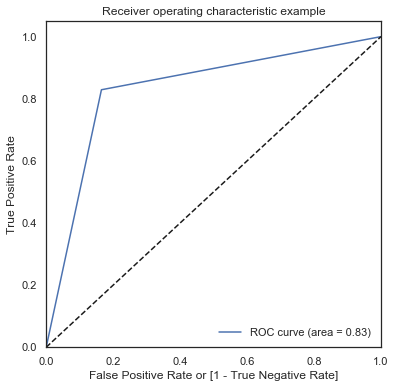

(array([0.        , 0.16498352, 1.        ]),
 array([0.       , 0.8289839, 1.       ]),
 array([2, 1, 0], dtype=int64))

In [1982]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Predicted)

In [1983]:
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_pred_final.Churn, y_train_pred_final.Predicted)))

roc_auc_score : 0.83


     Probability  Accuracy  Sensitivity  Specificity
0.0          0.0  0.086123     1.000000     0.000000
0.1          0.1  0.419185     0.976124     0.366700
0.2          0.2  0.591335     0.951138     0.557428
0.3          0.3  0.701846     0.909495     0.682277
0.4          0.4  0.778118     0.872293     0.769243
0.5          0.5  0.834497     0.828984     0.835016
0.6          0.6  0.872466     0.781233     0.881063
0.7          0.7  0.899914     0.717379     0.917116
0.8          0.8  0.917464     0.615214     0.945947
0.9          0.9  0.920142     0.310383     0.977605


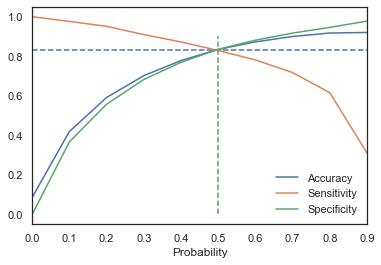

In [1984]:
OptimalCutoff(y_train_pred_final,0.5,0.83)

## Inferences
- From the curve above, 0.5 is the optimum cutoff value.
- Hence we choose 0.5. 

### Model Performance on Test Data - After optimized cutoff

In [1985]:
X_test_pred_lr = lr_pca.predict(X_test_pca)
X_test_predprob_lr = lr_pca.predict_proba(X_test_pca)[:,1]

In [1986]:
y_test_pred_final_lr = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':X_test_predprob_lr})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_test_pred_final_lr['Predicted'] = y_test_pred_final_lr.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_test_pred_final_lr.head()

,Churn,Churn_Prob,Predicted
0,0,0.218767,0
1,0,0.218295,0
2,0,0.562730,1
3,0,0.265221,0
4,0,0.613620,1


In [2108]:
print("-----Logistic Regression : Model Performance on Test Data with Optium Cutoff-----\n")
modelMetrics(y_test_pred_final_lr.Churn,y_test_pred_final_lr.Predicted)

-----Logistic Regression : Model Performance on Test Data with Optium Cutoff-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8264

Sensitivity or Recall of the Model : 0.8168
Specificity of the Model: 0.8360

False Positive Rate: 0.1640
Positive predictive value: 0.3169
Negative Predictive value: 0.9800
Accuracy value: 0.8343

Precision score value: 0.3169


## Summary

- The resulting model, after PCA and logistic regression (with optimal cutoff setting) has a right balance of different metrics score for sensitivity, specificity and Roc Accuracy on the train and test set.

    - Train Data
        - Sensitivity : **82.9%**
        - AUC Score : **83.2%**
    - Test Data
        - Sensitivity : **81.68%**
        - AUC Score : **82.64%**

# Random Forest Classifier

**Applying Random Forest Classifier on PCA with Hyperparameter tuning.**

## Tuning max_depth

In [1988]:
parameters = {'max_depth': range(10, 30, 5)}
rfc_max_depth = RandomForestClassifier(class_weight = 'balanced')
rfc_max_depth_gs = GridSearchCV(rfc_max_depth, parameters, 
                    cv=5,scoring="accuracy", 
                    return_train_score=True)
rfc_max_depth_gs.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [1989]:
scores_max_depth = rfc_max_depth_gs.cv_results_

<Figure size 1800x1440 with 0 Axes>

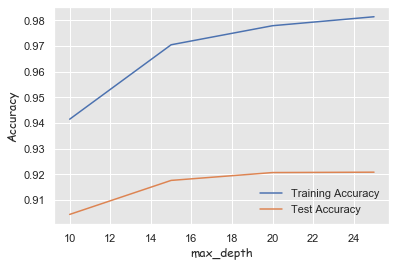

In [1990]:
fig = plt.figure(figsize=(25,20))
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_max_depth["param_max_depth"],scores_max_depth["mean_train_score"], label="Training Accuracy")
plt.plot(scores_max_depth["param_max_depth"],scores_max_depth["mean_test_score"], label="Test Accuracy")
plt.xlabel("max_depth",fontsize=12,family = "Comic Sans MS")
plt.ylabel("Accuracy", fontsize=12,family = "Comic Sans MS")
plt.legend()
plt.show()

# Inference

- Test Accuracy score becomes constant after maxdepth=20

## Tuning n_estimators

In [1991]:
parameters = {'n_estimators': range(50, 150, 25)}
rfc_n_estimators = RandomForestClassifier(class_weight = 'balanced',max_depth=20)
rfc_n_estimators_gs = GridSearchCV(rfc_n_estimators, parameters, 
                    cv=5,scoring="accuracy",return_train_score=True)
rfc_n_estimators_gs.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=20,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                               

In [1992]:
scores_n_estimators = rfc_n_estimators_gs.cv_results_

<Figure size 1800x1440 with 0 Axes>

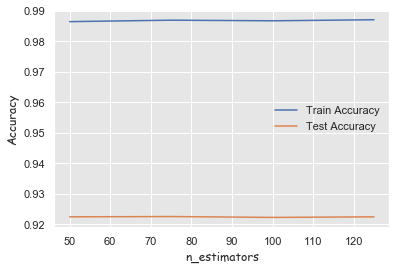

In [1993]:
fig = plt.figure(figsize=(25,20))
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_n_estimators["param_n_estimators"],scores_n_estimators["mean_train_score"],label="Train Accuracy")
plt.plot(scores_n_estimators["param_n_estimators"],scores_n_estimators["mean_test_score"],label="Test Accuracy")
plt.xlabel("n_estimators",fontsize=12,family = "Comic Sans MS")
plt.ylabel("Accuracy", fontsize=12,family = "Comic Sans MS")
plt.legend()
plt.show()

## Inference
- Selecting n_estimators = 80

## Tuning max features

In [1994]:
parameters = {'max_features': [4, 8, 14, 20, 24]}
rfc_max_features = RandomForestClassifier(class_weight = 'balanced',max_depth=20,n_estimators=80)
rfc_max_features_gs = GridSearchCV(rfc_max_features, parameters, 
                    cv=5,scoring="f1",return_train_score=True)
rfc_max_features_gs.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=20,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=80, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                   

In [1995]:
scores_max_features = rfc_max_features_gs.cv_results_

<Figure size 1800x1440 with 0 Axes>

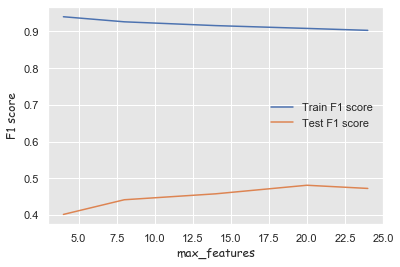

In [1996]:
fig = plt.figure(figsize=(25,20))
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_max_features["param_max_features"],scores_max_features["mean_train_score"],label="Train F1 score")
plt.plot(scores_max_features["param_max_features"],scores_max_features["mean_test_score"],label="Test F1 score")
plt.xlabel("max_features",fontsize=12,family = "Comic Sans MS")
plt.ylabel("F1 score", fontsize=12,family = "Comic Sans MS")
plt.legend()
plt.show()

## Inference
- max_features = 15

## Tuning min_samples_leaf

In [1997]:
parameters = {'min_samples_leaf': range(100, 400, 50)}
rfc_min_samples_leaf = RandomForestClassifier(class_weight = 'balanced',max_depth=20,n_estimators=80,max_features=15)
rfc_min_samples_leaf_gs = GridSearchCV(rfc_min_samples_leaf, parameters, 
                    cv=5,scoring="f1",return_train_score=True)
rfc_min_samples_leaf_gs.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=20,
                                              max_features=15,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=80, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                       

In [1998]:
scores_min_samples_leaf = rfc_min_samples_leaf_gs.cv_results_

<Figure size 1800x1440 with 0 Axes>

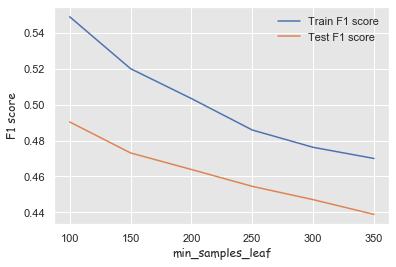

In [1999]:
fig = plt.figure(figsize=(25,20))
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_min_samples_leaf["param_min_samples_leaf"],scores_min_samples_leaf["mean_train_score"],label="Train F1 score")
plt.plot(scores_min_samples_leaf["param_min_samples_leaf"],scores_min_samples_leaf["mean_test_score"],label="Test F1 score")
plt.xlabel("min_samples_leaf",fontsize=12,family = "Comic Sans MS")
plt.ylabel("F1 score", fontsize=12,family = "Comic Sans MS")
plt.legend()
plt.show()

## Tuning min_sample_split

In [2000]:
parameters = {'min_samples_split': range(50, 300, 50)}
rfc_min_samples_split = RandomForestClassifier(class_weight = 'balanced',max_depth=20,n_estimators=80,
                                               max_features=15,min_samples_leaf=100)
rfc_min_samples_split_gs = GridSearchCV(rfc_min_samples_split, parameters, 
                    cv=5,scoring="f1",return_train_score=True)
rfc_min_samples_split_gs.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=20,
                                              max_features=15,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=100,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=80, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                     

In [2001]:
scores_min_samples_split = rfc_min_samples_split_gs.cv_results_

<Figure size 1800x1440 with 0 Axes>

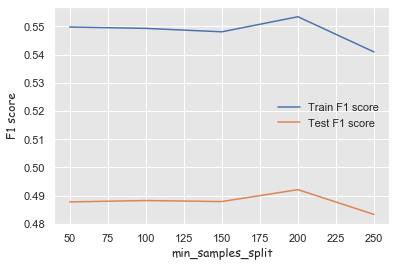

In [2002]:
fig = plt.figure(figsize=(25,20))
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_min_samples_split["param_min_samples_split"],scores_min_samples_split["mean_train_score"],label="Train F1 score")
plt.plot(scores_min_samples_split["param_min_samples_split"],scores_min_samples_split["mean_test_score"],label="Test F1 score")
plt.xlabel("min_samples_split",fontsize=12,family = "Comic Sans MS")
plt.ylabel("F1 score", fontsize=12,family = "Comic Sans MS")
plt.legend()
plt.show()

## Inference
- Selecting **min_samples_split** = 150

## Tunned Random Forest

In [2003]:
rfc_tunned = RandomForestClassifier(class_weight = 'balanced',max_depth=20,n_estimators=80,
                                               max_features=15,min_samples_leaf=100,min_samples_split=150)

In [2004]:
rfc_tunned.fit(X_train_pca, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=20, max_features=15,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=100,
                       min_samples_split=150, min_weight_fraction_leaf=0.0,
                       n_estimators=80, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

### Prediction & Probability Predection on Train Data

In [2005]:
X_train_pred_rfc = rfc_tunned.predict(X_train_pca)
X_train_predprob_rfc = rfc_tunned.predict_proba(X_train_pca)[:,1]

In [2006]:
X_train_pred[:10]

array([0, 1, 0, 0, 1, 0, 0, 0, 0, 1], dtype=int64)

In [2007]:
X_train_predprob[:10]

array([0.12694463, 0.93787561, 0.25633146, 0.2125771 , 0.79082329,
       0.10939882, 0.0244739 , 0.01633898, 0.23250824, 0.68570318])

### Prediction  on Test Data

In [2008]:
# predictions on Test data
X_test_pred_rfc = rfc_tunned.predict(X_test_pca)

In [2109]:
print("-----Model Performance on Test Data-----\n")
modelMetrics(y_test, X_test_pred_rfc)

-----Model Performance on Test Data-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8156

Sensitivity or Recall of the Model : 0.7435
Specificity of the Model: 0.8878

False Positive Rate: 0.1122
Positive predictive value: 0.3817
Negative Predictive value: 0.9738
Accuracy value: 0.8755

Precision score value: 0.3817


### Prediction on Train Data

In [2010]:
y_train_pred_final_rfc = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':X_train_predprob_rfc})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_train_pred_final_rfc['Predicted'] = y_train_pred_final_rfc.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_train_pred_final_rfc.head()

,Churn,Churn_Prob,Predicted
0,0,0.265160,0
1,0,0.868223,1
2,0,0.324224,0
3,0,0.292235,0
4,1,0.767563,1


In [2110]:
modelMetrics(y_train_pred_final_rfc.Churn,y_train_pred_final_rfc.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8542

Sensitivity or Recall of the Model : 0.8173
Specificity of the Model: 0.8912

False Positive Rate: 0.1088
Positive predictive value: 0.4144
Negative Predictive value: 0.9810
Accuracy value: 0.8848

Precision score value: 0.4144


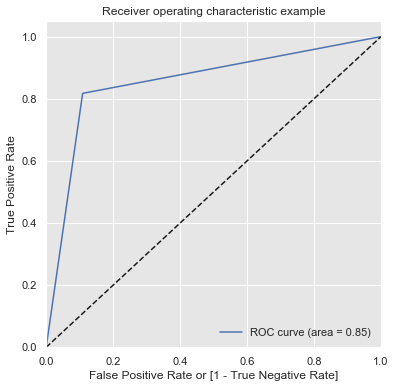

(array([0.        , 0.10883784, 1.        ]),
 array([0.        , 0.81732371, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [2012]:
draw_roc(y_train_pred_final_rfc.Churn, y_train_pred_final_rfc.Predicted)

In [2013]:
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_pred_final_rfc.Churn, y_train_pred_final_rfc.Predicted)))

roc_auc_score : 0.85


     Probability  Accuracy  Sensitivity  Specificity
0.0          0.0  0.086123     1.000000     0.000000
0.1          0.1  0.192856     1.000000     0.116791
0.2          0.2  0.472360     0.997224     0.422898
0.3          0.3  0.710071     0.977235     0.684894
0.4          0.4  0.825555     0.910050     0.817592
0.5          0.5  0.884803     0.817324     0.891162
0.6          0.6  0.914116     0.694059     0.934854
0.7          0.7  0.927888     0.556913     0.962849
0.8          0.8  0.928462     0.353692     0.982628
0.9          0.9  0.920381     0.106607     0.997070


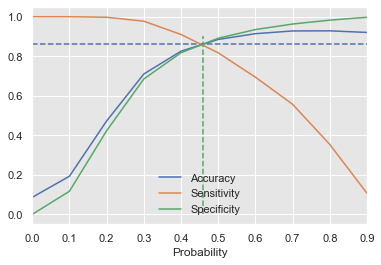

In [2014]:
OptimalCutoff(y_train_pred_final_rfc,0.46,0.86)

## Inferences
- From the curve above, **0.45** is the optimum point with Senitivity as **0.86** which is high enough.

In [2015]:
y_train_pred_final_rfc_opt = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':X_train_predprob_rfc})

# Creating new column 'predicted' with 1 if Churn_Prob>0.45 else 0
y_train_pred_final_rfc_opt['Predicted'] = y_train_pred_final_rfc_opt.Churn_Prob.map( lambda x: 1 if x > 0.45 else 0)
y_train_pred_final_rfc_opt.head()

,Churn,Churn_Prob,Predicted
0,0,0.265160,0
1,0,0.868223,1
2,0,0.324224,0
3,0,0.292235,0
4,1,0.767563,1


In [2111]:
modelMetrics(y_train_pred_final_rfc_opt.Churn,y_train_pred_final_rfc_opt.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8631

Sensitivity or Recall of the Model : 0.8673
Specificity of the Model: 0.8590

False Positive Rate: 0.1410
Positive predictive value: 0.3669
Negative Predictive value: 0.9856
Accuracy value: 0.8597

Precision score value: 0.3669


### Model Performance on Test Data - After optimized cutoff

In [2017]:
# predictions on Test data
X_test_pred_rfc_opt = rfc_tunned.predict(X_test_pca)
X_test_predprob_rfc_opt = rfc_tunned.predict_proba(X_test_pca)[:,1]

In [2018]:
X_test_pred_rfc_opt[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0], dtype=int64)

In [2019]:
X_test_predprob_rfc_opt[:10]

array([0.36150596, 0.26854134, 0.25626205, 0.16980664, 0.29685796,
       0.30624155, 0.41085595, 0.23604326, 0.54280682, 0.22083138])

In [2020]:
y_test_pred_final_rfc_opt = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':X_test_predprob_rfc_opt})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_test_pred_final_rfc_opt['Predicted'] = y_test_pred_final_rfc_opt.Churn_Prob.map( lambda x: 1 if x > 0.45 else 0)
y_test_pred_final_rfc_opt.head()

,Churn,Churn_Prob,Predicted
0,0,0.361506,0
1,0,0.268541,0
2,0,0.256262,0
3,0,0.169807,0
4,0,0.296858,0


In [2112]:
print("-----Model Performance on Test Data - After optimized cutoff-----\n")
modelMetrics(y_test_pred_final_rfc_opt.Churn,y_test_pred_final_rfc_opt.Predicted)

-----Model Performance on Test Data - After optimized cutoff-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8171

Sensitivity or Recall of the Model : 0.7762
Specificity of the Model: 0.8580

False Positive Rate: 0.1420
Positive predictive value: 0.3375
Negative Predictive value: 0.9763
Accuracy value: 0.8511

Precision score value: 0.3375


## Inferences

- Random Forest after selecting optimal cut-off also is resulting in a model with
    - Train Sensitivity : **86.73%** and Train Roc_auc_score : **86.31%**
    - Test Sensitivity : **77.62%** and Test Roc_auc_score : **81.71%**

## Decision Tree 

Applying **Decision Tree Classifier** on PCA with Hyperparameter tuning.

In [2022]:
dt = DecisionTreeClassifier(class_weight='balanced',
                             max_features='auto',
                             min_samples_split=100,
                             min_samples_leaf=100,
                             max_depth=6,
                             random_state=10)

In [2023]:
dt.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=6,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=10, splitter='best')

In [2024]:
X_train_pred_dt = dt.predict(X_train_pca)
X_train_predprob_dt = dt.predict_proba(X_train_pca)[:,1]

In [2025]:
X_train_pred_dt[:10]

array([0, 1, 0, 1, 1, 0, 0, 0, 1, 1], dtype=int64)

In [2026]:
X_train_predprob_dt[:10]

array([0.30025494, 0.87148517, 0.2645469 , 0.78123522, 0.90277019,
       0.24950072, 0.30025494, 0.14263851, 0.57252054, 0.78123522])

In [2027]:
print("Decision Tree Model Summary on Training Set")
print("\nAccuracy : %.4g" % metrics.roc_auc_score(y_train, X_train_pred_dt))
print("Recall/Sensitivity : %.4g" % metrics.recall_score(y_train, X_train_pred_dt))
print("AUC Score (Train): %f" % metrics.roc_auc_score(y_train, X_train_predprob_dt))

Decision Tree Model Summary on Training Set

Accuracy : 0.7666
Recall/Sensitivity : 0.7735
AUC Score (Train): 0.831749


### Predictions on Test data

In [2028]:
# predictions on Test data
X_test_pred_dt = dt.predict(X_test_pca)

In [2113]:
print("-----Decision Tree : Model Performance on Test Data-----\n")
modelMetrics(y_test, X_test_pred_dt)

-----Decision Tree : Model Performance on Test Data-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.7384

Sensitivity or Recall of the Model : 0.7277
Specificity of the Model: 0.7490

False Positive Rate: 0.2510
Positive predictive value: 0.2127
Negative Predictive value: 0.9672
Accuracy value: 0.7472

Precision score value: 0.2127


### Parameter grid based on the results of random search 

In [2030]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}
# Create a based model
dt_param = DecisionTreeClassifier(class_weight='balanced',random_state=10)
# Instantiate the grid search model
dt_param_gs = GridSearchCV(estimator = dt_param, param_grid = param_grid, 
                          cv = 3, n_jobs = 4,verbose = 1,scoring="f1_weighted")

In [2031]:
# Fit the grid search to the data
dt_param_gs.fit(X_train_pca, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  48 out of  48 | elapsed:   12.4s finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=10,
                                              splitter='best'),
             iid='warn', n_jobs=4,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                     

In [2032]:
print('Best Accuracy :',dt_param_gs.best_score_)
print(dt_param_gs.best_estimator_)

Best Accuracy : 0.8196510482772079
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=10, splitter='best')


In [2033]:
df_gini = DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=10, splitter='best')

In [2034]:
df_gini.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=10, splitter='best')

In [2035]:
X_train_pred_df_gini = df_gini.predict(X_train_pca)
X_train_predprob_df_gini = df_gini.predict_proba(X_train_pca)[:,1]

In [2036]:
X_train_pred_df_gini[:10]

array([1, 1, 0, 0, 1, 0, 0, 0, 0, 1], dtype=int64)

In [2037]:
X_train_predprob_df_gini[:10]

array([0.62409911, 0.92049604, 0.        , 0.        , 0.91163399,
       0.        , 0.02231092, 0.        , 0.        , 0.89028524])

In [2038]:
print(df_gini.score(X_test_pca,y_test))

0.771170367064599


In [2039]:
# predictions on Test data
X_test_pred_dt_gini = df_gini.predict(X_test_pca)

In [2114]:
print("-----Decision Tree : Model Performance on Test Data-----\n")
modelMetrics(y_test, X_test_pred_dt_gini)

-----Decision Tree : Model Performance on Test Data-----

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.7728

Sensitivity or Recall of the Model : 0.7749
Specificity of the Model: 0.7708

False Positive Rate: 0.2292
Positive predictive value: 0.2396
Negative Predictive value: 0.9735
Accuracy value: 0.7712

Precision score value: 0.2396


In [2041]:
y_train_pred_final_dt_gini = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':X_train_predprob_df_gini})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_train_pred_final_dt_gini['Predicted'] = y_train_pred_final_dt_gini.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_train_pred_final_dt_gini.head()

,Churn,Churn_Prob,Predicted
0,0,0.624099,1
1,0,0.920496,1
2,0,0.000000,0
3,0,0.000000,0
4,1,0.911634,1


In [2115]:
modelMetrics(y_train_pred_final_dt_gini.Churn,y_train_pred_final_dt_gini.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8486

Sensitivity or Recall of the Model : 0.9045
Specificity of the Model: 0.7927

False Positive Rate: 0.2073
Positive predictive value: 0.2914
Negative Predictive value: 0.9888
Accuracy value: 0.8024

Precision score value: 0.2914


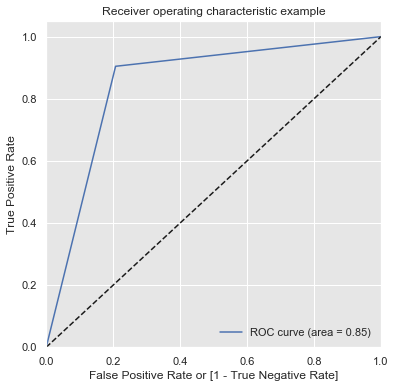

(array([0.        , 0.20726283, 1.        ]),
 array([0.       , 0.9044975, 1.       ]),
 array([2, 1, 0], dtype=int64))

In [2043]:
draw_roc(y_train_pred_final_dt_gini.Churn, y_train_pred_final_dt_gini.Predicted)

In [2044]:
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_pred_final_dt_gini.Churn, y_train_pred_final_dt_gini.Predicted)))

roc_auc_score : 0.85


     Probability  Accuracy  Sensitivity  Specificity
0.0          0.0  0.524340     1.000000     0.479514
0.1          0.1  0.641354     0.995003     0.608027
0.2          0.2  0.680184     0.986674     0.651300
0.3          0.3  0.711505     0.974459     0.686725
0.4          0.4  0.757125     0.948917     0.739051
0.5          0.5  0.802362     0.904498     0.792737
0.6          0.6  0.839805     0.847862     0.839046
0.7          0.7  0.878730     0.755136     0.890377
0.8          0.8  0.905365     0.628540     0.931453
0.9          0.9  0.918898     0.388118     0.968918


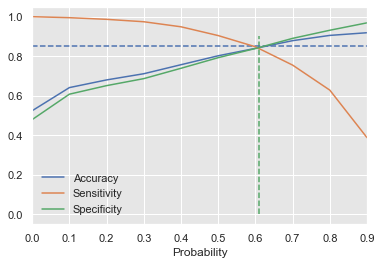

In [2045]:
OptimalCutoff(y_train_pred_final_dt_gini,0.61,0.85)

# Inference

- Optimal Cutoff values in 0.61

In [2046]:
y_train_pred_final_dt_gini_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':X_train_predprob_df_gini})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_train_pred_final_dt_gini_final['Predicted'] = y_train_pred_final_dt_gini_final.Churn_Prob.map( lambda x: 1 if x > 0.61 else 0)
y_train_pred_final_dt_gini_final.head()

,Churn,Churn_Prob,Predicted
0,0,0.624099,1
1,0,0.920496,1
2,0,0.000000,0
3,0,0.000000,0
4,1,0.911634,1


In [2116]:
modelMetrics(y_train_pred_final_dt_gini_final.Churn,y_train_pred_final_dt_gini_final.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8425

Sensitivity or Recall of the Model : 0.8423
Specificity of the Model: 0.8427

False Positive Rate: 0.1573
Positive predictive value: 0.3353
Negative Predictive value: 0.9827
Accuracy value: 0.8426

Precision score value: 0.3353


In [2048]:
X_test_pred_df_gini = df_gini.predict(X_test_pca)
X_test_predprob_df_gini = df_gini.predict_proba(X_test_pca)[:,1]

In [2049]:
X_test_pred_df_gini[:10]

array([0, 0, 1, 0, 0, 1, 0, 0, 0, 0], dtype=int64)

In [2050]:
X_test_predprob_df_gini[:10]

array([0.        , 0.        , 0.76679196, 0.30658539, 0.        ,
       0.50502888, 0.17800857, 0.04089359, 0.        , 0.04089359])

In [2051]:
y_test_pred_final_dt_gini = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':X_test_predprob_df_gini})

# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_test_pred_final_dt_gini['Predicted'] = y_test_pred_final_dt_gini.Churn_Prob.map( lambda x: 1 if x > 0.61 else 0)
y_test_pred_final_dt_gini.head()

,Churn,Churn_Prob,Predicted
0,0,0.000000,0
1,0,0.000000,0
2,0,0.766792,1
3,0,0.306585,0
4,0,0.000000,0


In [2117]:
modelMetrics(y_test_pred_final_dt_gini.Churn,y_test_pred_final_dt_gini.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.7715

Sensitivity or Recall of the Model : 0.7186
Specificity of the Model: 0.8244

False Positive Rate: 0.1756
Positive predictive value: 0.2760
Negative Predictive value: 0.9692
Accuracy value: 0.8154

Precision score value: 0.2760


## Inference
- Decision tree after selecting optimal cut-off also is resulting in a model with
    - Train Sensitivity : **84.23%** and Train Roc_auc_score : **84.25%**
    - Test Sensitivity : **71.8%** and Test Roc_auc_score : **77.15%**

## Logistic Regression without PCA

In [2053]:
# Running RFE with the output number of the variable equal to 15
logreg = LogisticRegression(class_weight='balanced')

rfe = RFE(logreg, 15)             

In [2054]:
rfe = rfe.fit(X_train, y_train)

In [2055]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('onnet_mou_6', False, 43),
 ('onnet_mou_7', False, 10),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_6', False, 53),
 ('offnet_mou_7', False, 25),
 ('offnet_mou_8', True, 1),
 ('roam_ic_mou_6', False, 81),
 ('roam_ic_mou_7', False, 66),
 ('roam_ic_mou_8', False, 98),
 ('roam_og_mou_6', False, 80),
 ('roam_og_mou_7', False, 65),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 51),
 ('loc_og_t2t_mou_7', False, 101),
 ('loc_og_t2t_mou_8', False, 3),
 ('loc_og_t2m_mou_6', False, 54),
 ('loc_og_t2m_mou_7', False, 24),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 107),
 ('loc_og_t2f_mou_7', False, 63),
 ('loc_og_t2f_mou_8', False, 75),
 ('loc_og_t2c_mou_6', False, 67),
 ('loc_og_t2c_mou_7', False, 106),
 ('loc_og_t2c_mou_8', False, 115),
 ('loc_og_mou_6', False, 19),
 ('loc_og_mou_7', False, 16),
 ('loc_og_mou_8', False, 2),
 ('std_og_t2t_mou_6', False, 112),
 ('std_og_t2t_mou_7', False, 9),
 ('std_og_t2t_mou_8', False, 83),
 ('std_og_t2m_mou_6', False, 103),
 ('std_o

In [2056]:
cols=X_train.columns[rfe.support_]
cols

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2m_mou_8',
       'total_og_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_7', 'total_ic_mou_6',
       'total_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8',
       'last_day_rch_amt_8', 'vol_2g_mb_8', 'vol_3g_mb_8',
       'total_rech_month_7'],
      dtype='object')

In [2057]:
#Function to fit the logistic regression model from the statmodel package
def fit_LogRegModel(X_train):
    # Adding a constant variable  
    X_train = sm.add_constant(X_train)
    lm = sm.GLM(y_train,X_train,family = sm.families.Binomial()).fit() 
    print(lm.summary())
    return lm

In [2058]:
# Calculate the VIFs for the new model
def getVIF(X_train):
    vif = pd.DataFrame()
    X = X_train
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [2059]:
# Creating X_test dataframe with RFE selected variables
X_train_1 = X_train[cols]

In [2060]:
lm_1 = fit_LogRegModel(X_train_1)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                20912
Model:                            GLM   Df Residuals:                    20896
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3944.2
Date:                Mon, 18 May 2020   Deviance:                       7888.4
Time:                        19:15:16   Pearson chi2:                 2.48e+05
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4766      0

In [2061]:
getVIF(X_train_1)

,Features,VIF
5,loc_ic_t2m_mou_8,6.26
8,total_ic_mou_8,5.31
4,total_og_mou_7,5.13
14,total_rech_month_7,5.06
1,offnet_mou_8,4.74
6,loc_ic_mou_7,4.66
3,loc_og_t2m_mou_8,4.54
7,total_ic_mou_6,3.96
10,total_rech_num_8,2.95
0,onnet_mou_8,2.58


In [2062]:
X_train_2 = X_train_1.drop('loc_ic_t2m_mou_8', axis=1)
lm_2 = fit_LogRegModel(X_train_2)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                20912
Model:                            GLM   Df Residuals:                    20897
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3963.6
Date:                Mon, 18 May 2020   Deviance:                       7927.3
Time:                        19:15:17   Pearson chi2:                 1.56e+05
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4971      0

In [2063]:
getVIF(X_train_2)

,Features,VIF
4,total_og_mou_7,5.13
13,total_rech_month_7,5.06
1,offnet_mou_8,4.73
7,total_ic_mou_8,4.62
5,loc_ic_mou_7,4.39
6,total_ic_mou_6,3.96
3,loc_og_t2m_mou_8,3.33
9,total_rech_num_8,2.91
0,onnet_mou_8,2.57
10,last_day_rch_amt_8,2.25


In [2064]:
col_nam = list(X_train_2.columns)

In [2065]:
# Getting the predicted values on the train set
X_train_2 = sm.add_constant(X_train_2)
y_train_pred_rfe = lm_2.predict(X_train_2)

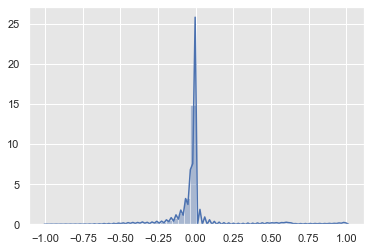

In [2066]:
res = y_train - y_train_pred_rfe
sns.distplot(res)

In [2067]:
y_train_pred_rfe[:10]

63145    0.021856
43510    0.576718
99970    0.034368
34176    0.009705
31672    0.310948
92573    0.000347
81564    0.000644
73293    0.002313
8476     0.013639
83063    0.166547
dtype: float64

In [2068]:
y_train_pred_final_rfe = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
# Creating new column 'predicted' with 1 if Churn_Prob>0.45 else 0
y_train_pred_final_rfe['Predicted'] = y_train_pred_final_rfe.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_train_pred_final_rfe.head()

,Churn,Churn_Prob,Predicted
63145,0,0.024880,0
43510,0,0.579648,1
99970,0,0.028895,0
34176,0,0.002858,0
31672,1,0.305794,0


In [2069]:
modelMetrics(y_train_pred_final_rfe.Churn,y_train_pred_final_rfe.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.6382

Sensitivity or Recall of the Model : 0.2915
Specificity of the Model: 0.9849

False Positive Rate: 0.0151
Positive predictive value: 0.6458
Negative Predictive value: 0.9365

Precision score value: 0.6458


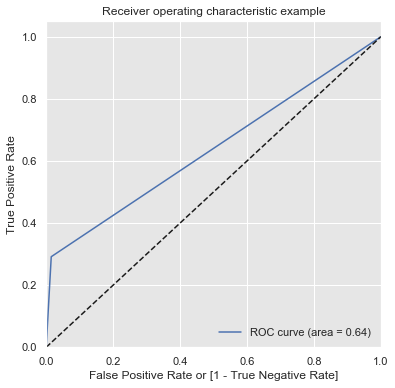

(array([0.        , 0.01506986, 1.        ]),
 array([0.        , 0.29150472, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [2070]:
draw_roc(y_train_pred_final_rfe.Churn, y_train_pred_final_rfe.Predicted)

In [2071]:
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_pred_final_rfe.Churn, y_train_pred_final_rfe.Predicted)))

roc_auc_score : 0.64


     Probability  Accuracy  Sensitivity  Specificity
0.0          0.0  0.086123     1.000000     0.000000
0.1          0.1  0.838418     0.820100     0.840144
0.2          0.2  0.902209     0.725708     0.918843
0.3          0.3  0.922437     0.646308     0.948459
0.4          0.4  0.928510     0.509162     0.968029
0.5          0.5  0.925210     0.291505     0.984930
0.6          0.6  0.920285     0.138812     0.993930
0.7          0.7  0.916794     0.057746     0.997750
0.8          0.8  0.915312     0.023876     0.999320
0.9          0.9  0.914642     0.009994     0.999895


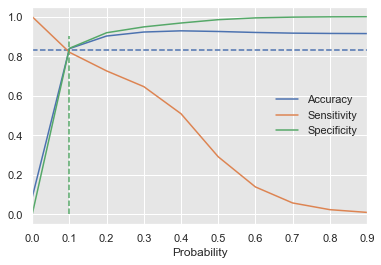

In [2072]:
OptimalCutoff(y_train_pred_final_rfe,0.1,0.83)

In [2073]:
y_train_pred_final_rfe_opt = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})

# Creating new column 'predicted' with 1 if Churn_Prob>0.45 else 0
y_train_pred_final_rfe_opt['Predicted'] = y_train_pred_final_rfe_opt.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)
y_train_pred_final_rfe_opt.head()

,Churn,Churn_Prob,Predicted
63145,0,0.024880,0
43510,0,0.579648,1
99970,0,0.028895,0
34176,0,0.002858,0
31672,1,0.305794,1


In [2074]:
modelMetrics(y_train_pred_final_rfe_opt.Churn,y_train_pred_final_rfe_opt.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.8301

Sensitivity or Recall of the Model : 0.8201
Specificity of the Model: 0.8401

False Positive Rate: 0.1599
Positive predictive value: 0.3259
Negative Predictive value: 0.9802

Precision score value: 0.3259


In [2075]:
X_test=X_test[cols]

In [2076]:
X_test.shape

(8963, 15)

In [2077]:
# predictions on Test data
#X_test = sm.add_constant(X_test)
X_test_pred_rfe_opt = lm_2.predict(X_test)

In [2078]:
X_test_pred_rfe_opt[:10]

25632    0.071961
8339     0.086278
18512    0.035848
99963    0.063238
48537    0.279642
73178    0.030354
61390    0.001169
88370    0.073857
3424     0.154546
57405    0.012617
dtype: float64

In [2079]:
y_test_pred_final_rfe = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':X_test_pred_rfe_opt})
# Creating new column 'predicted' with 1 if Churn_Prob>0.45 else 0
y_test_pred_final_rfe['Predicted'] = y_test_pred_final_rfe.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)
y_test_pred_final_rfe.head()

,Churn,Churn_Prob,Predicted
25632,0,0.071961,0
8339,0,0.086278,0
18512,0,0.035848,0
99963,0,0.063238,0
48537,0,0.279642,1


In [2080]:
modelMetrics(y_test_pred_final_rfe.Churn,y_test_pred_final_rfe.Predicted)

*****Different metrics values for the Model*****

Roc_auc_score of the Model: 0.7108

Sensitivity or Recall of the Model : 0.8141
Specificity of the Model: 0.6074

False Positive Rate: 0.3926
Positive predictive value: 0.1619
Negative Predictive value: 0.9723

Precision score value: 0.1619


In [2081]:
print(col_nam)

['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2m_mou_8', 'total_og_mou_7', 'loc_ic_mou_7', 'total_ic_mou_6', 'total_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8', 'last_day_rch_amt_8', 'vol_2g_mb_8', 'vol_3g_mb_8', 'total_rech_month_7']


In [2102]:
# Selecting the coefficients of the selected features from our final model excluding the intercept
pd.options.display.float_format = '{:.2f}'.format
coeff_param = lm_2.params[1:]
print(type(coeff_param))

<class 'pandas.core.series.Series'>


In [2103]:
#Getting a relative coeffient value for all the features wrt the feature with the highest coefficient
feature_importance = coeff_param
feature_importance = feature_importance - feature_importance.min()
feature_importance = 100 * feature_importance/feature_importance.max()
feature_importance = pd.DataFrame(feature_importance)
feature_importance.head(10)

,0
onnet_mou_8,79.63
offnet_mou_8,80.43
roam_og_mou_8,85.95
loc_og_t2m_mou_8,77.22
total_og_mou_7,88.15
loc_ic_mou_7,94.48
total_ic_mou_6,100.00
total_ic_mou_8,0.00
spl_ic_mou_8,78.63
total_rech_num_8,79.67


In [2104]:
feature_importance['Feature'] = feature_importance.index
feature_importance= feature_importance.rename(columns={ 0 : 'Relative Feature Importance'})
# sorting data frame by name 
feature_importance.sort_values("Relative Feature Importance", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 
feature_importance.reset_index(drop=True, inplace=True)
feature_importance.head(15)

,Relative Feature Importance,Feature
0,100.00,total_ic_mou_6
1,94.48,loc_ic_mou_7
2,88.15,total_og_mou_7
3,86.41,total_rech_month_7
4,85.95,roam_og_mou_8
5,80.43,offnet_mou_8
6,79.67,total_rech_num_8
7,79.63,onnet_mou_8
8,79.47,vol_2g_mb_8
9,78.63,spl_ic_mou_8


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 <a list of 14 Text xticklabel objects>)

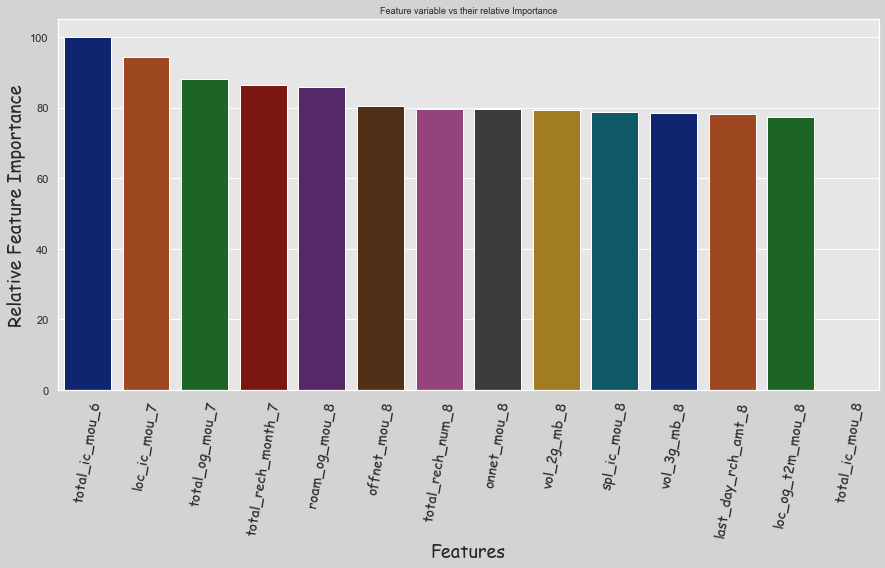

In [2092]:
# Plot showing the feature variables based on their relative coefficient values
fig = plt.figure(figsize=(50,15))
fig.set_facecolor("lightgrey")

plt.subplot(2,3,1)
sns.barplot(x='Feature',y='Relative Feature Importance',data=feature_importance,palette="dark")
plt.title("Feature variable vs their relative Importance",fontsize=9)
plt.xlabel("Features",fontsize=18,family = "Comic Sans MS")
plt.ylabel("Relative Feature Importance",fontsize=18,family = "Comic Sans MS")
plt.xticks(rotation = 80,fontsize=14,family="Comic Sans MS")

# Model Selection

*Sensitivity is the most important business metric for the telecom churn problem.*

The company would like to identify most customers at risk of churning, even if there are many customers that are misclassified as churn. The cost to the company of churning is much higher than having a few false positives.A test that’s highly sensitive will flag almost everyone who has the disease and not generate many false-negative results.



| Model/Metrics                           | Train  | Test   |
|-----------------------------------------|--------|--------|
| Logistic Regression ( cut-off = 0.5)    |        |        | 
|-----------------------------------------|--------|--------|
|Roc_auc_score                            |**83.20%** | **82.64%**|
|-----------------------------------------|--------|--------|
|Sensitivity                              |**82.90%** | **82.64%**|
|-----------------------------------------|--------|--------|
|Specificity                              |83.50%  | 82.64% |
|-----------------------------------------|--------|--------|
|Accuracy                                 |**83.45%** | **83.43%**|
|-----------------------------------------|--------|--------|
|Precision                                |32.14%  | 31.64% |
|-----------------------------------------|--------|--------|
|Random Forest Classifier (cut-off = 0.45)|        |        | 
|-----------------------------------------|--------|--------|
|Roc_auc_score                            |**86.31%** | **81.71%**|
|-----------------------------------------|--------|--------|
|Sensitivity                              |**86.73%** | **77.62%**|
|-----------------------------------------|--------|--------|
|Specificity                              |85.90%  | 85.80% |
|-----------------------------------------|--------|--------|
|Accuracy                                 |**85.97%** | **85.11%**|
|-----------------------------------------|--------|--------|
|Precision                                |36.69%  | 33.75% |
|-----------------------------------------|--------|--------|
| Decision Tree ( cut-off = 0.61)         |        |        | 
|-----------------------------------------|--------|--------|
|Roc_auc_score                            |**84.25%** | **77.15%**|
|-----------------------------------------|--------|--------|
|Sensitivity                              |**84.23%** | **71.86%**|
|-----------------------------------------|--------|--------|
|Specificity                              |84.27%  | 82.4% |
|-----------------------------------------|--------|--------|
|Accuracy                                 |**84.26%** | **81.54%**|
|-----------------------------------------|--------|--------|
|Precision                                |33.53%  | 27.60% |


- Overall, the **Logistic Regression model** with probability cut-off = 0.5, performs best. It achieved the best **Sensitivity accuracy of 83.4%** for test data. Also the overall accuracy and specificity is consistent for Test and train data, thus avoiding over-fitting. The precision is compromised in this effort but the business objective to predict Churn customers is most accurately captured by it. 


- Next, **Random Forest Classifier** achives a **Sensitivity rate of 77.62%** and balanced overall accuracy of 85% on train and test.


- From the **Decision Tree** we have obtained the Sensitivity of 71.8% with an overall Specificity as **82.4%**. A high-specificity test will correctly rule out almost all the customers who will not get Churn and won’t generate many false-positive results


# Relevant churn features

- **13 features have been used by the model to predict whether a Customer will get Churned or not.** 
- **The coefficient values for each mentioned features are used to determine the order of importance.**
- **Features with high positive coefficients are the ones that contributed the most towards the probability of Customer getting Churned.**

**Most of the main predictiors of churn are the monthly KPI features for the action phase.**

- **total_ic_mou_6** - Total incoming minutes of usage in month June
- **loc_ic_mou_7** - local incoming minutes of usage in month July
- **total_og_mou_7** - Total outgoing calls minutes of usage in month July
- **total_rech_month_7** - Total month recharge amount in month 8
- **roam_og_mou_8** - Total Roaming outgoing minutes of usage
- **offnet_mou_8** - Minutes of units for all kind of call outside the operator
- **total_rech_num_8** - total number of recharges done in the month September
- **onnet_mou_8** - Minutes of units for all kind of call from same network 
- **vol_2g_mb_8** -volume of 2G data (MB) consumed for month September
- **spl_ic_mou_8** - Special oincoming call for the month of September
- **vol_3g_mb_8** -volume of 3G data (MB) consumed for month September
- **last_day_rch_amt_8** - Last Day recharge Amount for September month
- **loc_og_t2m_mou_8** - Local outgoing Operator T to other Operators for September month
- **total_ic_mou_8** - Total incoming call minutes of usage for monthe of Spetember


## Strategies to manage customer churn

Customer retention is more important then customer acquisition. For many incumbent operators, retaining high profitable customers is the number one business goal.

Key features to looks are -
1. Incoming calls
2. Outgoing calls
3. Monthly data service consumed by Customer

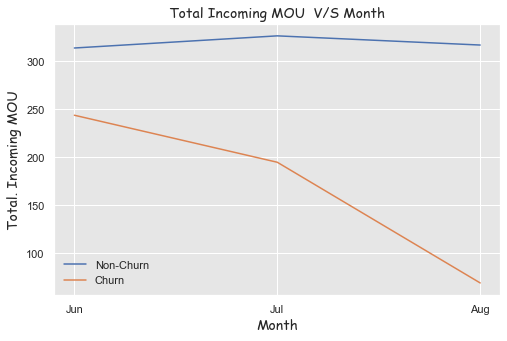

In [2141]:
plot_Churn_vs_NotChurn(ic_col,'Incoming')

**Monitoring Drop in usage** 

- Based on the above, key features are incoming calls.

- Drop in Usage is an important feature in predicting customer CHURN.

*Stratergy suggestions*
- The company need to closely monitor the drop in "Minutes of usage" and figure out the user experience. Based on the data, provide them incentives to keep them happy and engaged while company fixes the issues and provide better user experience.

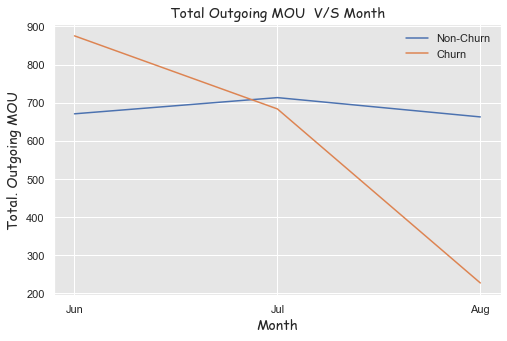

In [2142]:
plot_Churn_vs_NotChurn(og_col,'Outgoing')

**Improving Outgoing services**

From the above graph, initially, churner's outgoing usage was more than that of non-churners. Gradually it started dropping there outgoing usage. May be these customers was not satifisfy with the outgoing services offered. Or may be Tariff's are very high. This could be further investigated by the network service provider.

*Stratergy suggestions*
- Operators must compare the outgoing tariff with their Competitors.
- Check their marketing stratergy.

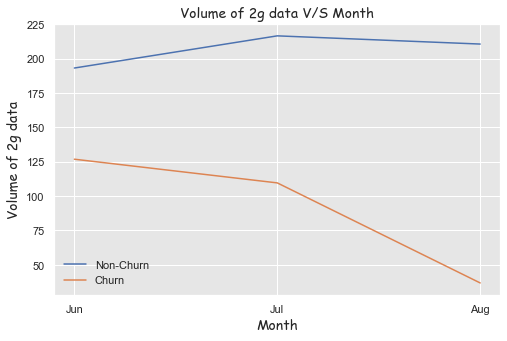

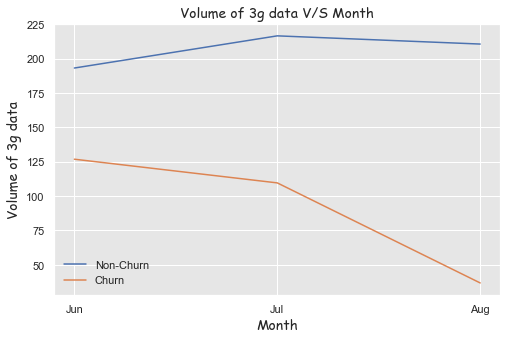

In [2162]:
plot_byChurnVol(vol_2g_col,'Volume of 2g data')
plot_byChurnVol(vol_2g_col,'Volume of 3g data')

From Above Graph

**Monitoring Drop in data usage**

- Drop in data usage is an important feature in predicting customer CHURN.

*Stratergy suggestions*

- The company need to closely monitor the drop in data usage and figure out the user experience. Based on the data, provide them incentives to keep them happy and engaged while company fixes the issues and provide better user experience.

Other factors like **Last day Recharge Amount**
- Track and monitor the recharges done by the customer. Suggest them the best suitable option as per their needs so that customers are benefitted and keep recharging on time.